In [1]:
import os
import random

import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F

import matplotlib.pyplot as plt
import matplotlib as mpl

from functools import partial

import time
import scipy.stats as stats
import seaborn as sns
import arviz as az

#import constants

from tqdm import tqdm
from tqdm.auto import tqdm
tqdm.pandas()

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:98% !important; }</style>"))

pd.set_option('display.max_columns', None)

mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42

/opt/anaconda3/envs/Boda_2/lib/python3.7/site-packages/tqdm/std.py:702: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  from pandas import Panel


In [2]:
boda2_df = pd.read_csv('/Users/castrr/Dropbox (JAX)/Datasets/BODA2/BODA2_MPRA_results_pred_contributions_v3.txt', sep=" ", low_memory=False)

control_filter = ~boda2_df['method'].notnull()
#boda2_df.loc[control_filter, 'method'] = 'ctrl'

no_controls_df = boda2_df[~control_filter].reset_index(drop=True)
rounds_0_df = no_controls_df[no_controls_df['round'] == 0].reset_index(drop=True)

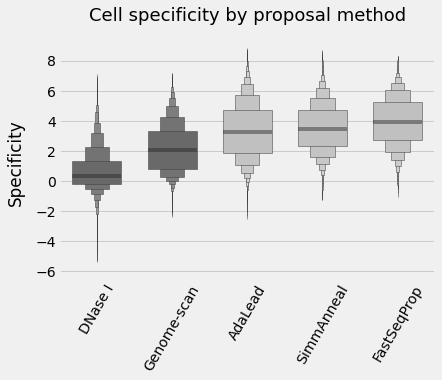

In [3]:
all_methods = ['DHS', 'gs', 'al', 'sa', 'fsp']
cell_types = ['K562', 'HepG2', 'SKNSH']
target_cells = ['k562', 'hepg2', 'sknsh']
l2fc_columns = [f'{cell_type}_signal' for cell_type in cell_types]
colors = 2*['dimgray'] + 3*['silver']

row_filter = (boda2_df['method'].isin(all_methods)) & (boda2_df['round'] == 0)
plot_df = boda2_df[row_filter].copy()

quality_filter = (plot_df[['K562_lfcSE', 'HepG2_lfcSE', 'SKNSH_lfcSE']].max(axis=1) <= 1.0)
plot_df = plot_df[quality_filter].reset_index(drop=True)
with plt.style.context('fivethirtyeight'):
#     sns.violinplot(data=plot_df, x='target_cell', y=f'{cell_type}_signal', inner='box',
#                    order=target_cells, palette='tab10')
    g = sns.boxenplot(data=plot_df, x='method', y=f'OverMax', k_depth='full',
                  order=all_methods, palette=colors,
                  saturation=0.75, width=0.65, showfliers=False
                 )
    plt.ylim(-6.5, 9)
    g.set_xticklabels(['DNase I', 'Genome-scan', 'AdaLead', 'SimmAnneal', 'FastSeqProp'])
    plt.xlabel("", labelpad=10)
    plt.ylabel("Specificity", labelpad=10)
    plt.title('Cell specificity by proposal method', fontsize=18, y=1.08)
    plt.xticks(rotation=60)
    plt.show()

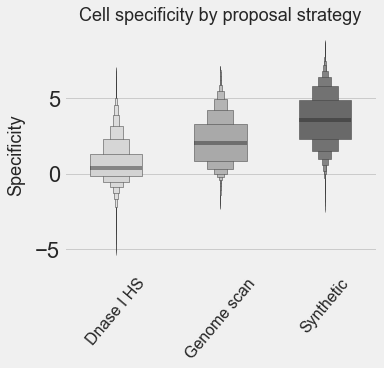

In [26]:
all_methods = ['DHS', 'gs', 'al', 'sa', 'fsp']
cell_types = ['K562', 'HepG2', 'SKNSH']
target_cells = ['k562', 'hepg2', 'sknsh']
l2fc_columns = [f'{cell_type}_signal' for cell_type in cell_types]
colors = ['lightgrey', 'darkgray', 'dimgray']

row_filter = (boda2_df['method'].isin(all_methods)) & (boda2_df['round'] == 0)
plot_df = boda2_df[row_filter].copy()

plot_df.loc[plot_df['method'].isin(['DHS']), 'origin_tag'] = 'Dnase I HS'
plot_df.loc[plot_df['method'].isin(['gs']), 'origin_tag'] = 'Genome scan'
plot_df.loc[plot_df['method'].isin(['al', 'sa', 'fsp']), 'origin_tag'] = 'Synthetic'

quality_filter = (plot_df[['K562_lfcSE', 'HepG2_lfcSE', 'SKNSH_lfcSE']].max(axis=1) <= 1.0)
plot_df = plot_df[quality_filter].reset_index(drop=True)
with plt.style.context('fivethirtyeight'):
    plt.figure(figsize=(5,4))
    g = sns.boxenplot(data=plot_df, x='origin_tag', y=f'OverMax', k_depth='full',
                  order=['Dnase I HS', 'Genome scan', 'Synthetic'], palette=colors, width=0.5,
                  showfliers=False,
                 )
    plt.ylim(-6.5, 9)
    plt.ylabel("Specificity", labelpad=10, fontsize=18)
    plt.title('Cell specificity by proposal strategy', fontsize=18, y=1.05)
    plt.xlabel("", labelpad=10)
    g.set_xticklabels(['Dnase I HS', 'Genome scan', 'Synthetic'], fontsize=16)
    plt.xticks(rotation=50)
    plt.show()

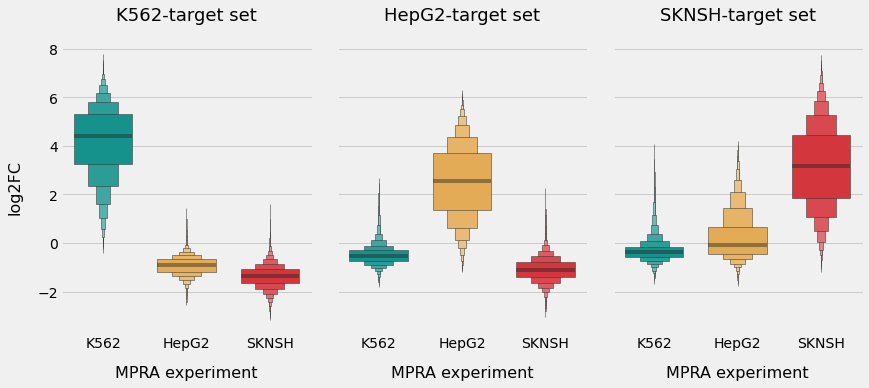

In [8]:
all_methods = ['al', 'sa', 'fsp']
cell_types = ['K562', 'HepG2', 'SKNSH']
target_cells = ['k562', 'hepg2', 'sknsh']

row_filter = (boda2_df['method'].isin(all_methods)) & (boda2_df['round'] == 0)
plot_df = boda2_df[row_filter].copy()
quality_filter = (plot_df[['K562_lfcSE', 'HepG2_lfcSE', 'SKNSH_lfcSE']].max(axis=1) <= 1.0)
plot_df = plot_df[quality_filter].reset_index(drop=True)

temp_df = plot_df[[*l2fc_columns, 'target_cell']]

#colors = [(0, 1, 1), (1, 0.85, 0.1), (1, 0, 0)]
#colors = [(0, 1, 1), 'gold', (1, 0, 0)]
colors = ['#00A79D', '#FBB040', '#ED1C24']

styles = ['ggplot', 'fivethirtyeight', 'fast', 'dark_background']

with plt.style.context(styles[1]):
    g = sns.catplot(data=temp_df, col='target_cell', kind='boxen', palette=colors, col_order=target_cells,
                   showfliers=False, aspect=0.8, width=0.7)
    
    g.set_axis_labels('MPRA experiment', "log2FC", fontsize=16, labelpad=15)
    g.set_xticklabels(['K562', 'HepG2', 'SKNSH'], fontsize=14)    
    #g.set_yticklabels([-4, -2, 0, 2, 4, 6, 8, 10], size = 14)
    g.set_titles("{col_name} target")
    #g.fig.subplots_adjust(top=10.0)
    #g.despine(left=True)
    for ax, title in zip(g.axes.flat, ['K562-target set', 'HepG2-target set', 'SKNSH-target set']):
        ax.set_title(title, fontsize=18, y=1.05)
    plt.show()

fsp


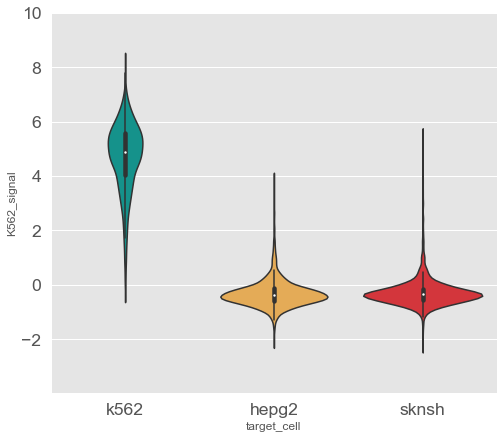

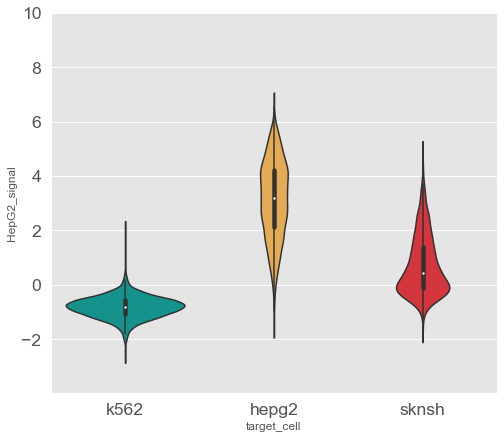

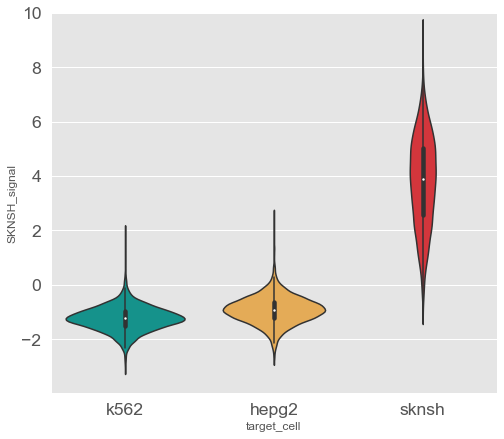

sa


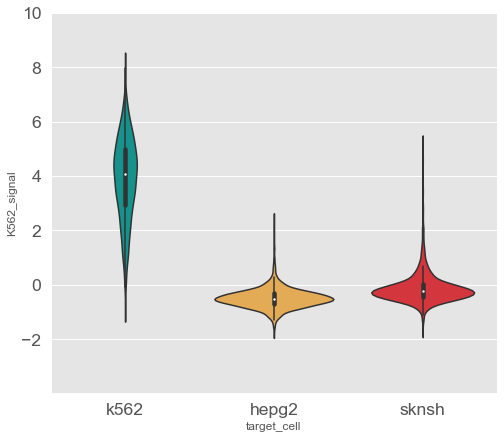

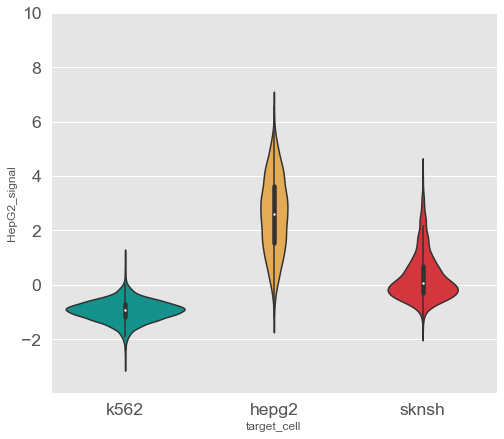

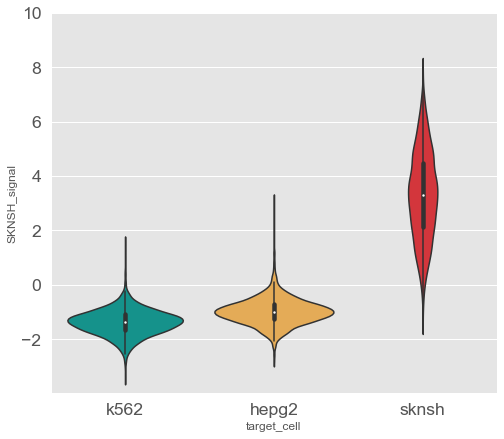

al


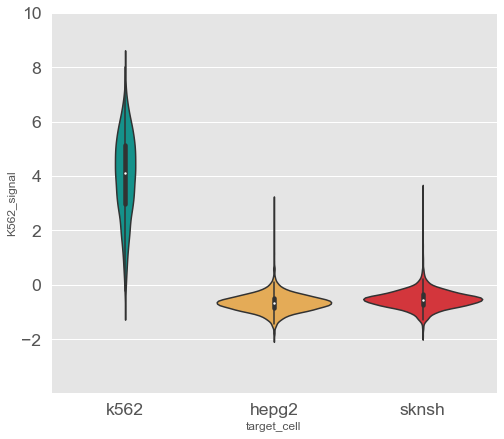

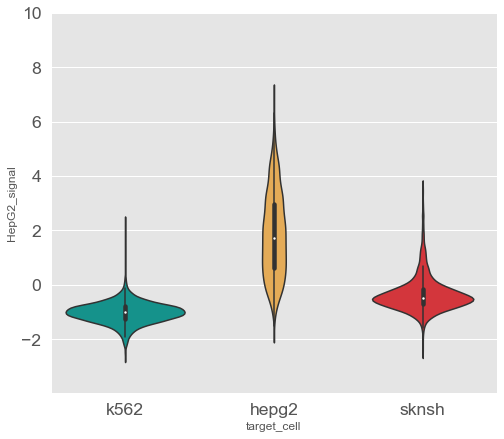

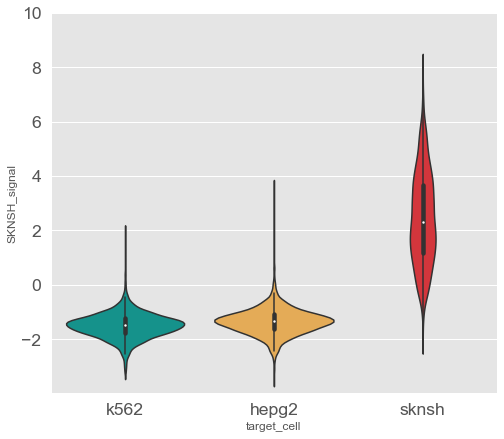

In [10]:
all_methods = ['fsp', 'sa', 'al']
cell_types = ['K562', 'HepG2', 'SKNSH']
target_cells = ['k562', 'hepg2', 'sknsh']
#colormaps = ['winter', 'autumn', 'summer']

sns.set(font_scale = 1.6)
with plt.style.context('ggplot'):
    for method in all_methods:
        print(method)
        if method in ['fsp', 'al', 'sa']:
            row_filter = (boda2_df['method'] == method) & (boda2_df['round'] == 0) #& (boda2_df['HepG2_signal'] < 10)
        else:
            row_filter = (boda2_df['method'] == method)
        plot_df = boda2_df[row_filter].copy()
        quality_filter = (plot_df[['K562_lfcSE', 'HepG2_lfcSE', 'SKNSH_lfcSE']].max(axis=1) <= 1.0)
        plot_df = plot_df[quality_filter].reset_index(drop=True)
        for color_idx, cell_type in enumerate(cell_types):   
            plt.figure(figsize=(8,7))
            sns.violinplot(data=plot_df, x='target_cell', y=f'{cell_type}_signal', inner='box',
                           order=target_cells, palette=colors)
            plt.ylim(-3.99, 10)
            #plt.title(f'{method} | {cell_type}')#, fontsize=16)
            plt.show()

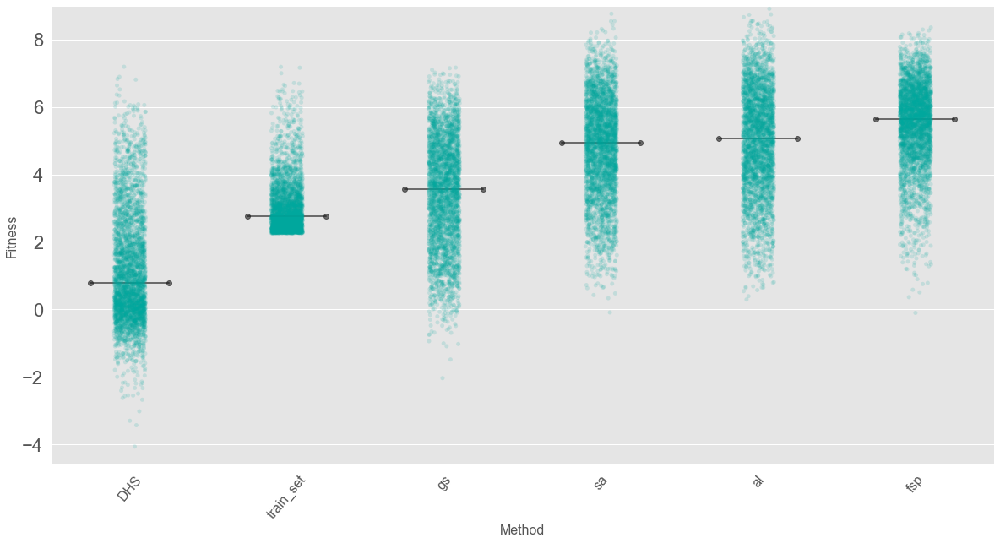

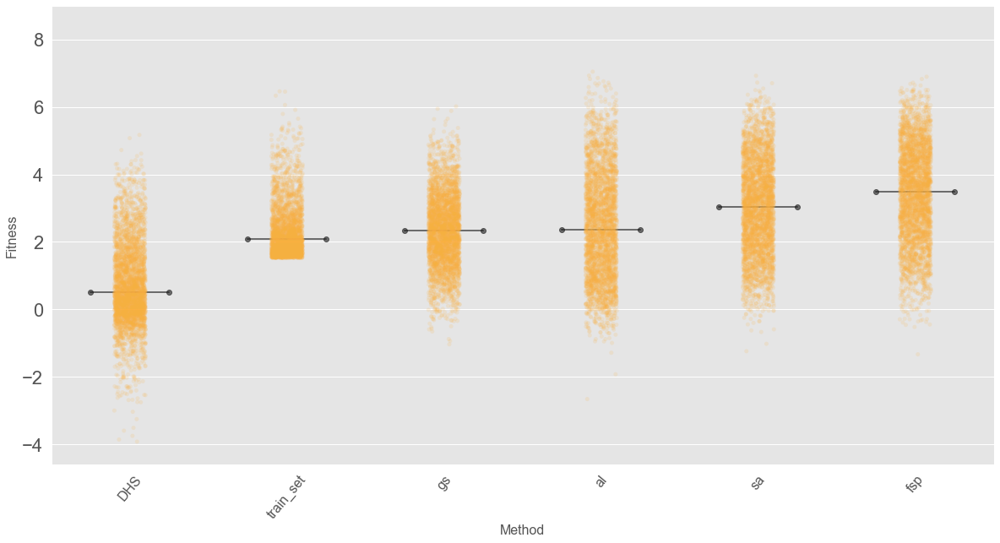

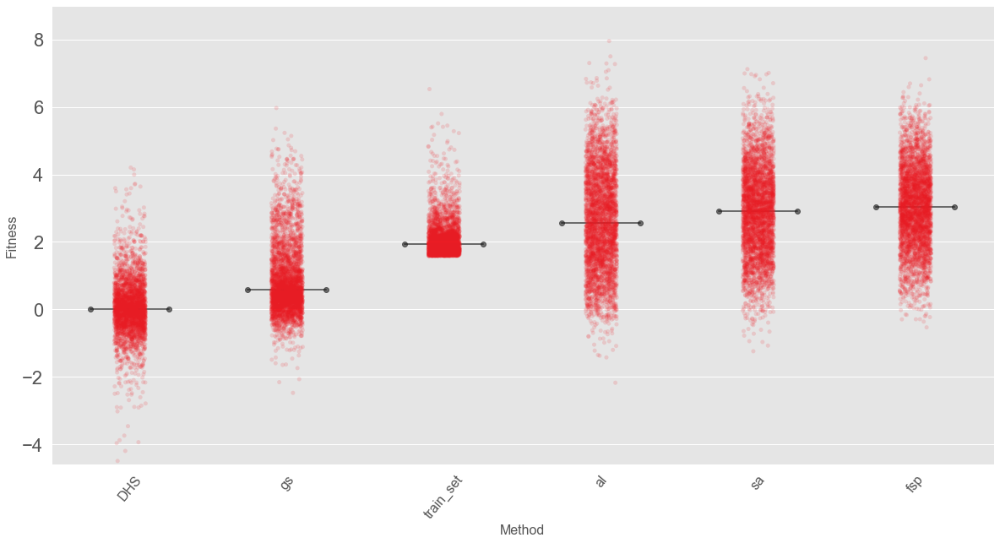

In [11]:
method_subset = ['DHS', 'train_set', 'gs', 'fsp', 'al', 'sa']
#method_subset = ['DHS', 'train_set', 'gs', 'fsp', 'al', 'sa', 'fsp_uc', 'al_uc', 'sa_uc']
quality_filter = (rounds_0_df[['K562_lfcSE', 'HepG2_lfcSE', 'SKNSH_lfcSE']].max(axis=1) <= 1.0) 
plot_df = rounds_0_df[quality_filter].copy().reset_index(drop=True)
plot_df = plot_df[plot_df['method'].isin(method_subset)]
sns.set(font_scale = 2.0)
cmap = plt.get_cmap("tab10")
fig_size = (10, 5)

for color_idx, cell_type in enumerate(['k562', 'hepg2', 'sknsh']):  
    temp_df2 = plot_df[(plot_df['target_cell'] == cell_type)].copy()
    temp_order = temp_df2.groupby(by=['method'])['OverMax'].median().sort_values(ascending=True).index 
    #Color = cmap(color_idx)
    #Color = f'C{color_idx}'
    Color = colors[color_idx]
    with plt.style.context('ggplot'): 
        plt.figure(figsize=(20,10))
        sns.stripplot(data=temp_df2, x='method', y='OverMax', order=temp_order,
                      color=Color, alpha=.15)
        sns.boxplot(data=temp_df2, x='method', y='OverMax', order=temp_order, fliersize=0.5, color=Color,
                    width=0.5,
                    showmeans=True,
                    meanline=True,
                    showfliers=False,
                    showbox=False,
                    showcaps=False,
                    #meanprops={'color': 'k', 'ls': '-', 'lw': 2, "marker": "o",
                               #"markerfacecolor":'k', "markeredgecolor":'k', 'alpha':0.4},
                    #medianprops={'visible': False},
                    meanprops={'visible': False},
                    medianprops={'color': 'k', 'ls': '-', 'lw': 2, "marker": "o",
                               "markerfacecolor":'k', "markeredgecolor":'k', 'alpha':0.6},
                    whiskerprops={'visible': False})

        plt.xticks(rotation=50, fontsize=16)
        plt.xlabel('Method', fontsize=16)
        plt.ylabel('Fitness', fontsize=16)
        #plt.title(f'{cell_type.upper()} | OverMax', fontsize=20)
        plt.ylim(-4.6, 9)
        plt.show()

In [4]:
boda2_tf_df = pd.read_csv('/Users/castrr/Dropbox (JAX)/Datasets/BODA2/HOCOMOCO_truly_full_BODA2_contributions.txt', sep=" ", low_memory=False)

In [5]:
boda2_tf_df

,name,contribution_K562,contribution_HepG2,contribution_SKNSH,KLdiv_K562,KLdiv_HepG2,KLdiv_SKNSH
0,AHR_HUMAN.H11MO.0.B,0.292600,0.172500,0.232656,5.485833,5.674351,5.746961
1,AIRE_HUMAN.H11MO.0.C,0.114136,0.342688,0.118959,6.455518,5.980478,6.741730
2,ALX1_HUMAN.H11MO.0.B,0.089994,0.319151,0.193332,6.596463,6.884126,6.649460
3,ALX3_HUMAN.H11MO.0.D,0.064392,0.694632,0.055322,10.203506,8.263048,10.653247
4,ALX4_HUMAN.H11MO.0.D,-0.088712,0.269676,0.196675,12.329305,13.087026,13.057011
...,...,...,...,...,...,...,...
764,ZNF8_HUMAN.H11MO.0.C,-0.007606,-0.228630,-0.485762,19.869150,16.200769,15.603162
765,ZSC16_HUMAN.H11MO.0.D,0.264328,0.471684,-0.107927,11.555760,9.867026,7.858142
766,ZSC22_HUMAN.H11MO.0.C,0.746852,0.446472,0.591060,7.751661,8.199842,7.974253
767,ZSC31_HUMAN.H11MO.0.C,0.285255,0.162480,0.155196,9.688213,9.811185,10.012496


In [58]:
short_names = [x.split('_')[0] for x in boda2_tf_df['name'].tolist()]

short_names_with_distinction = [short_names[0]]
for i in range(1, len(short_names)):
    if short_names[i] == short_names[i-1]:
        short_names_with_distinction.append(f'{short_names[i]}.1')
    else:
        short_names_with_distinction.append(short_names[i])

In [77]:


KLs = boda2_tf_df[['KLdiv_K562', 'KLdiv_HepG2', 'KLdiv_SKNSH']].min(axis=1)
text_alphas = (1 - KLs / KLs.max())**3

#contribs = boda2_tf_df[['contribution_K562', 'contribution_HepG2', 'contribution_SKNSH']].abs().max(axis=1)
# text_alphas = text_alphas * contribs
# text_alphas = text_alphas / text_alphas.max()

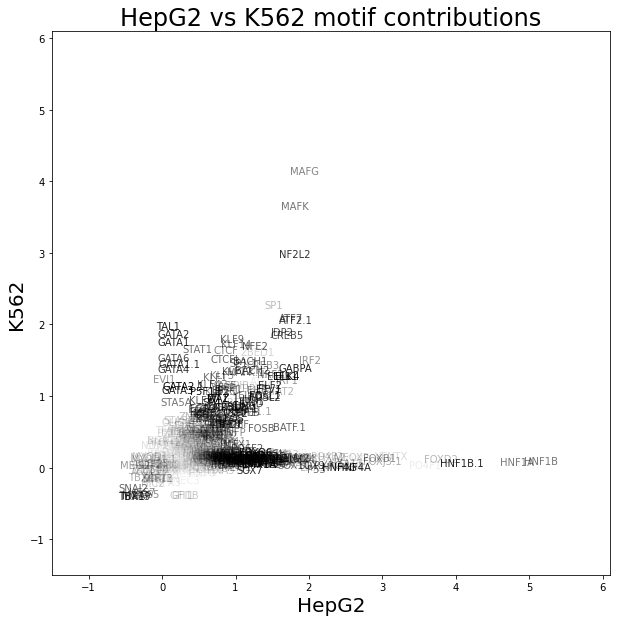

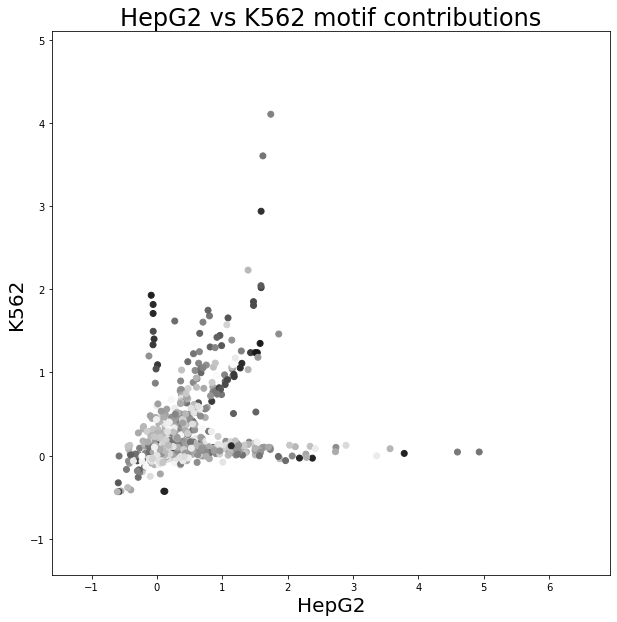

In [125]:
# K562 HepG2 SKNSH

x_cell = 'HepG2'
y_cell = 'K562'

plt.figure(figsize=(10,10))

x_axis = boda2_tf_df[f'contribution_{x_cell}'].tolist()
y_axis = boda2_tf_df[f'contribution_{y_cell}'].tolist()

x_max, y_max = max(x_axis), max(y_axis)
x_min, y_min = min(x_axis), min(y_axis)

for i, text in enumerate(short_names_with_distinction):
    x = x_axis[i]
    y = y_axis[i]
    alpha = text_alphas[i]
    alpha_condition = (x - 0.1)**2 + (y - 0.1)**2
    if alpha_condition < 1:
        alpha = alpha_condition**1.2
#     if (x**2 + y**2) < 0.1:
#         alpha = 0.1
#     if (x**2 + y**2) < 0.01:
#         alpha = 0.05
    plt.text(x, y, text, alpha=alpha)
# plt.xlim(x_min - 1, x_max + 2)
# plt.ylim(y_min - 1, y_max + 1)

plt.xlim(-1.5, 6.1)
plt.ylim(-1.5, 6.1)

plt.title(f'{x_cell} vs {y_cell} motif contributions', fontsize=24)
plt.xlabel(x_cell, fontsize=20)
plt.ylabel(y_cell, fontsize=20)
plt.show()

plt.figure(figsize=(10,10))

plt.scatter(x=x_axis, y=y_axis, marker='o', c=text_alphas, cmap='binary')
plt.xlim(x_min - 1, x_max + 2)
plt.ylim(y_min - 1, y_max + 1)

plt.title(f'{x_cell} vs {y_cell} motif contributions', fontsize=24)
plt.xlabel(x_cell, fontsize=20)
plt.ylabel(y_cell, fontsize=20)

plt.show()

In [116]:
from adjustText import adjust_text

plt.figure(figsize=(10,9))

plt.scatter(x=x_axis, y=y_axis, marker='o', c=text_alphas, cmap='binary')
plt.xlim(x_min - 1, x_max + 2)
plt.ylim(y_min - 1, y_max + 1)

plt.title(f'{x_cell} vs {y_cell} motif contributions', fontsize=24)
plt.xlabel(x_cell, fontsize=20)
plt.ylabel(y_cell, fontsize=20)

plt.show()

ModuleNotFoundError: No module named 'adjustText'

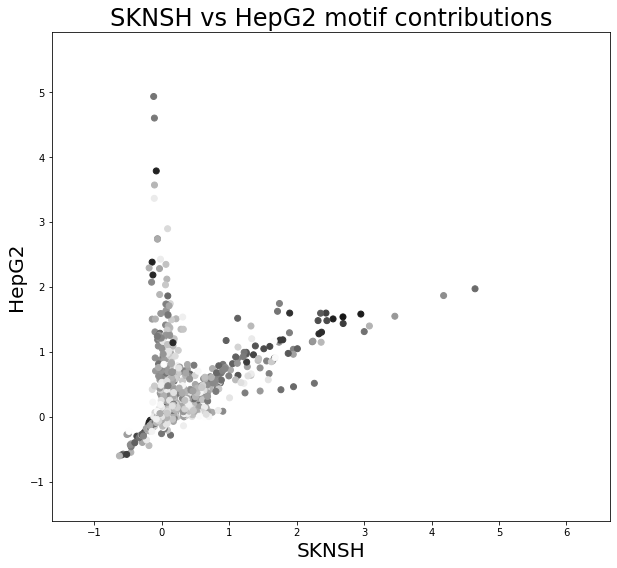

In [114]:
x_cell = 'SKNSH'
y_cell = 'HepG2'

plt.figure(figsize=(10,9))

x_axis = boda2_tf_df[f'contribution_{x_cell}'].tolist()
y_axis = boda2_tf_df[f'contribution_{y_cell}'].tolist()

x_max, y_max = max(x_axis), max(y_axis)
x_min, y_min = min(x_axis), min(y_axis)

plt.scatter(x=x_axis, y=y_axis, marker='o', c=text_alphas, cmap='binary')
plt.xlim(x_min - 1, x_max + 2)
plt.ylim(y_min - 1, y_max + 1)

plt.title(f'{x_cell} vs {y_cell} motif contributions', fontsize=24)
plt.xlabel(x_cell, fontsize=20)
plt.ylabel(y_cell, fontsize=20)

plt.show()

### Explore scatters

In [3]:
from matplotlib import cm
import matplotlib.colors as mcolors
from matplotlib.colors import Normalize 
from scipy.interpolate import interpn
from matplotlib.colors import LinearSegmentedColormap

def CustomCmap(from_rgb, to_rgb):
    # from color r,g,b
    r1,g1,b1 = from_rgb
    # to color r,g,b
    r2,g2,b2 = to_rgb
    cdict = {'red': ((0, r1, r1),
                   (1, r2, r2)),
           'green': ((0, g1, g1),
                    (1, g2, g2)),
           'blue': ((0, b1, b1),
                   (1, b2, b2))}
    cmap = LinearSegmentedColormap('custom_cmap', cdict)
    return cmap

def hex_to_rgb(value):
    '''
    Converts hex to rgb colours
    value: string of 6 characters representing a hex colour.
    Returns: list length 3 of RGB values'''
    value = value.strip("#") # removes hash symbol if present
    lv = len(value)
    return tuple(int(value[i:i + lv // 3], 16) for i in range(0, lv, lv // 3))

def rgb_to_dec(value):
    '''
    Converts rgb to decimal colours (i.e. divides each value by 256)
    value: list (length 3) of RGB values
    Returns: list (length 3) of decimal values'''
    return [v/256 for v in value]

def get_continuous_cmap(hex_list, float_list=None):
    ''' creates and returns a color map that can be used in heat map figures.
        If float_list is not provided, colour map graduates linearly between each color in hex_list.
        If float_list is provided, each color in hex_list is mapped to the respective location in float_list. 
        
        Parameters
        ----------
        hex_list: list of hex code strings
        float_list: list of floats between 0 and 1, same length as hex_list. Must start with 0 and end with 1.
        
        Returns
        ----------
        colour map'''
    rgb_list = [rgb_to_dec(hex_to_rgb(i)) for i in hex_list]
    if float_list:
        pass
    else:
        float_list = list(np.linspace(0,1,len(rgb_list)))
        
    cdict = dict()
    for num, col in enumerate(['red', 'green', 'blue']):
        col_list = [[float_list[i], rgb_list[i][num], rgb_list[i][num]] for i in range(len(float_list))]
        cdict[col] = col_list
    cmp = mcolors.LinearSegmentedColormap('my_cmp', segmentdata=cdict, N=256)
    return cmp

def density_scatter( x , y, ax=None, sort=True, bins=20, figsize=(8,8), **kwargs)   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=figsize)
    data , x_e, y_e = np.histogram2d( x, y, bins=bins, density=True)
    z = interpn( (0.5*(x_e[1:] + x_e[:-1]), 0.5*(y_e[1:]+y_e[:-1])), data, \
                np.vstack([x,y]).T, method="splinef2d", bounds_error=False)

    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    # Sort the points by density, so that the densest points are plotted last
    if sort:
        idx = z.argsort()
        x, y, z = x[idx], y[idx], z[idx]

    ax.scatter(x, y, c=z, **kwargs)

    #norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    norm = mcolors.TwoSlopeNorm(vmin=np.min(z), vcenter=np.quantile(z, 0.01), vmax=np.max(z))
#     cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
#     cbar.ax.set_ylabel('Density')

    return ax

In [23]:
pred_suffix = 'pred_aggreg'

all_methods = ['DHS', 'gs', 'al', 'sa', 'fsp']
cell_types = ['K562', 'HepG2', 'SKNSH']

row_filter = (boda2_df['method'].isin(all_methods))
plot_df = boda2_df[row_filter].copy()

quality_filter = (plot_df[['K562_lfcSE', 'HepG2_lfcSE', 'SKNSH_lfcSE']].max(axis=1) <= 1.0)
plot_df = plot_df[quality_filter].reset_index(drop=True)

r_0 = stats.pearsonr(plot_df['K562_signal'].to_numpy(), plot_df[f'K562_{pred_suffix}'].to_numpy())[0]
r_1 = stats.pearsonr(plot_df['HepG2_signal'].to_numpy(), plot_df[f'HepG2_{pred_suffix}'].to_numpy())[0]
r_2 = stats.pearsonr(plot_df['SKNSH_signal'].to_numpy(), plot_df[f'SKNSH_{pred_suffix}'].to_numpy())[0]

print(np.mean([r_0, r_1, r_2]))
print(r_0, r_1, r_2)

r_0 = stats.spearmanr(plot_df['K562_signal'].to_numpy(), plot_df[f'K562_{pred_suffix}'].to_numpy())[0]
r_1 = stats.spearmanr(plot_df['HepG2_signal'].to_numpy(), plot_df[f'HepG2_{pred_suffix}'].to_numpy())[0]
r_2 = stats.spearmanr(plot_df['SKNSH_signal'].to_numpy(), plot_df[f'SKNSH_{pred_suffix}'].to_numpy())[0]

print(np.mean([r_0, r_1, r_2]))
print(r_0, r_1, r_2)

0.8605331945507703
0.9013188287886812 0.795655139055956 0.8846256158076735
0.8905507102991876
0.9066093339628132 0.8419508893003069 0.923091907634443


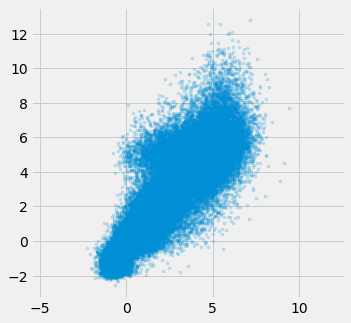

In [35]:
with plt.style.context('fivethirtyeight'):
    plt.figure(figsize=(5,5))
    plt.scatter(plot_df['K562_signal'].to_numpy(), plot_df[f'K562_{pred_suffix}'].to_numpy(),
                marker='.', alpha=0.2)
    plt.xlim(-5, 12)
    plt.ylim(-5, 12)
    plt.axis('equal')
    plt.show()

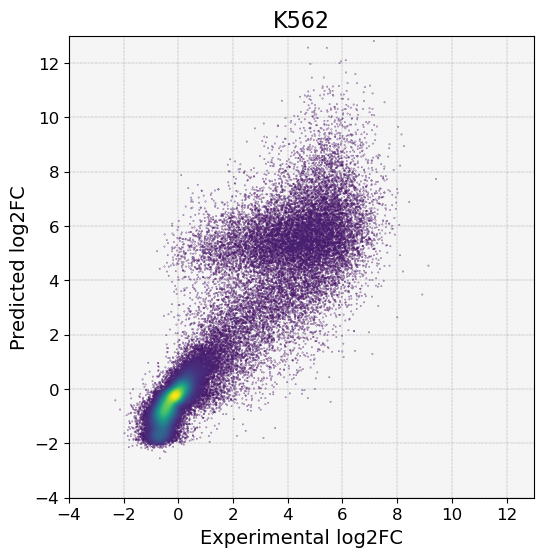

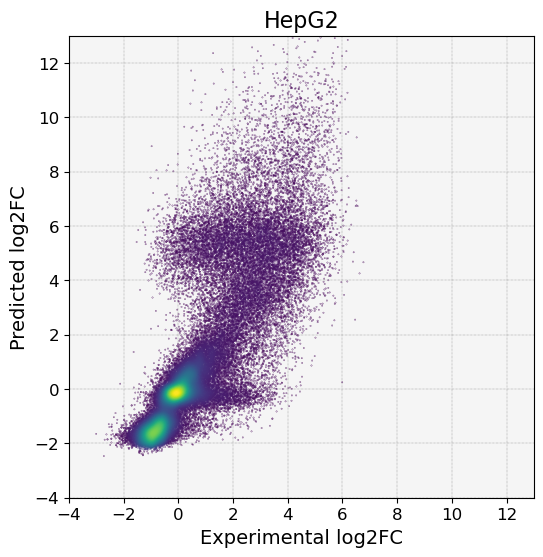

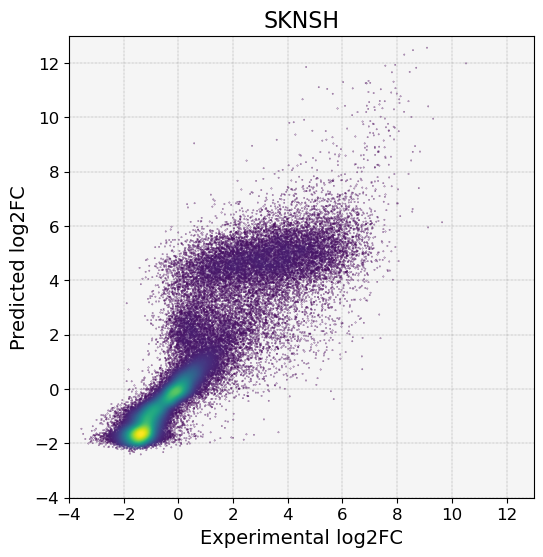

In [271]:
all_methods = ['DHS', 'gs', 'al', 'sa', 'fsp']
cell_types = ['K562', 'HepG2', 'SKNSH']

row_filter = (boda2_df['method'].isin(all_methods)) & (boda2_df['round'] == 0)
plot_df = boda2_df[row_filter].copy()

quality_filter = (plot_df[['K562_lfcSE', 'HepG2_lfcSE', 'SKNSH_lfcSE']].max(axis=1) <= 1.0)
plot_df = plot_df[quality_filter].reset_index(drop=True)

custom_maps = [get_continuous_cmap(['#00A79D', '#73FFF6']),
               get_continuous_cmap(['#FBB040', '#FDDFB1']),
               get_continuous_cmap(['#ED1C24', '#F7A2A5'])]

# custom_maps = [get_continuous_cmap(['#00A79D', '#4AFFF3']),
#                get_continuous_cmap(['#FBB040', '#FFD698']),
#                get_continuous_cmap(['#ED1C24', '#FF7D82'])]

# custom_maps = [get_continuous_cmap(['#73FFF6', '#00A79D']),
#                get_continuous_cmap(['#FDDFB1', '#FBB040']),
#                get_continuous_cmap(['#F7A2A5', '#ED1C24'])]

# custom_maps = [get_continuous_cmap(['#00A79D', '#C1E6E4']),
#                get_continuous_cmap(['#FBB040', '#F0E8DC']),
#                get_continuous_cmap(['#ED1C24', '#EBD5D5'])]

fig_size = (6, 6)
for cmap_idx, cell_type in enumerate(cell_types):
    nonnan_filter = plot_df[f'{cell_type}_signal'].notnull()
    x, y = plot_df.loc[nonnan_filter][f'{cell_type}_signal'].to_numpy(), plot_df.loc[nonnan_filter][f'{cell_type}_pred_aggreg'].to_numpy()
    with plt.style.context('default'):
        fig, ax = plt.subplots(figsize=fig_size)  
        
        #--- Contours ---
        contour_df = plot_df[(plot_df['method'] == 'fsp') & (plot_df['target_cell'] == cell_type.lower())]
        x_contour = contour_df[f'{cell_type}_signal']
        y_contour = contour_df[f'{cell_type}_pred_aggreg'] 
        confidence_ellipse(x_contour, y_contour, ax=ax, linewidth=50)
        #---
        
        #ax = density_scatter(x, y, bins=50, s=0.05, ax=ax, cmap=custom_maps[cmap_idx], alpha=1.0, figsize=fig_size)
        ax = density_scatter(x, y, bins=50, s=0.05, ax=ax, alpha=1.0, figsize=fig_size)
        ax.set_axisbelow(True)
        plt.grid(True, color = "grey", linewidth = "0.25", linestyle = "-.")
        

        
        plt.title(f'{cell_type}', fontsize=16)
        plt.xlabel('Experimental log2FC', fontsize=14)
        plt.ylabel('Predicted log2FC', fontsize=14)
        plt.xlim(-4, 13)
        plt.ylim(-4, 13)        
        plt.xticks(fontsize=12)
        plt.yticks(fontsize=12)
        ax.set_facecolor('whitesmoke')
        plt.show()

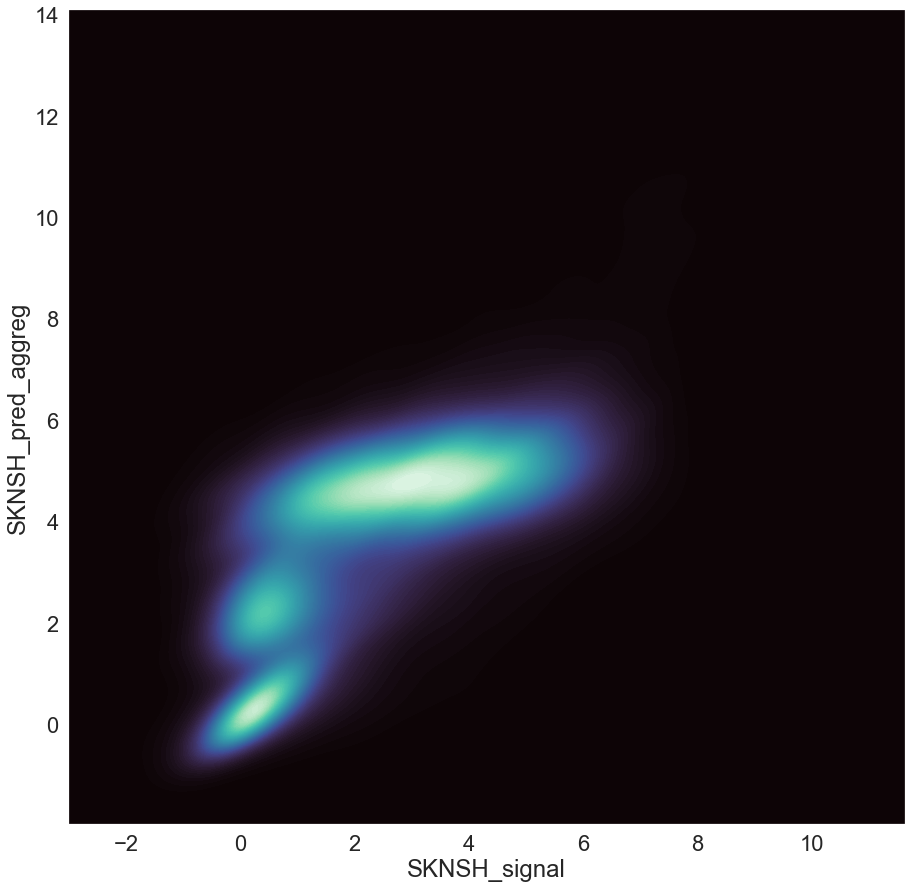

In [369]:
#contour_df = plot_df[(plot_df['method'] == 'fsp') & (plot_df['target_cell'] == cell_type.lower())]
contour_df = plot_df[(plot_df['target_cell'] == cell_type.lower())]

x_column = f'{cell_type}_signal'
y_column = f'{cell_type}_pred_aggreg'

plt.figure(figsize=(15,15))
# #sns.kdeplot(data=contour_df, x=x_column, y=y_column , cmap="Reds", shade=True, bw_adjust=.5, hue='method')
# sns.kdeplot(data=contour_df, x=x_column, y=y_column , shade=False, thresh=0, hue='method', alpha=0.75, fill=True, levels=3, cmap="mako")
# plt.show()

#sns.relplot(data=contour_df, x=x_column, y=y_column, alpha=0.5, s=10.0, height=10)
sns.kdeplot(
    data=contour_df, x=x_column, y=y_column,
    fill=True, thresh=0, levels=100, cmap="mako",
)

plt.show()

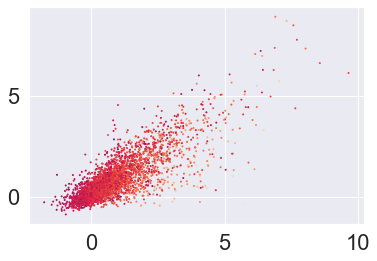

In [310]:
contour_df = plot_df[(plot_df['method'] == 'DHS') & (plot_df['target_cell'] == cell_type.lower())]
#contour_df = plot_df[(plot_df['method'] == 'fsp')]
x = contour_df[f'{cell_type}_signal']
y = contour_df[f'{cell_type}_pred_aggreg'] 
z = contour_df['OverMax']

plt.scatter(x, y, c=z, s=1.0)
#plt.contour(x, y, c=z)
plt.show()

In [272]:
from matplotlib.patches import Ellipse
import matplotlib.transforms as transforms

def confidence_ellipse(x, y, ax, n_std=3.0, facecolor='none', **kwargs):
    """
    Create a plot of the covariance confidence ellipse of *x* and *y*.

    Parameters
    ----------
    x, y : array-like, shape (n, )
        Input data.

    ax : matplotlib.axes.Axes
        The axes object to draw the ellipse into.

    n_std : float
        The number of standard deviations to determine the ellipse's radiuses.

    **kwargs
        Forwarded to `~matplotlib.patches.Ellipse`

    Returns
    -------
    matplotlib.patches.Ellipse
    """
    if x.size != y.size:
        raise ValueError("x and y must be the same size")

    cov = np.cov(x, y)
    pearson = cov[0, 1]/np.sqrt(cov[0, 0] * cov[1, 1])
    # Using a special case to obtain the eigenvalues of this
    # two-dimensional dataset.
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    ellipse = Ellipse((0, 0), width=ell_radius_x * 2, height=ell_radius_y * 2,
                      facecolor=facecolor, **kwargs)

    # Calculating the standard deviation of x from
    # the squareroot of the variance and multiplying
    # with the given number of standard deviations.
    scale_x = np.sqrt(cov[0, 0]) * n_std
    mean_x = np.mean(x)

    # calculating the standard deviation of y ...
    scale_y = np.sqrt(cov[1, 1]) * n_std
    mean_y = np.mean(y)

    transf = transforms.Affine2D() \
        .rotate_deg(45) \
        .scale(scale_x, scale_y) \
        .translate(mean_x, mean_y)

    ellipse.set_transform(transf + ax.transData)
    return ax.add_patch(ellipse)

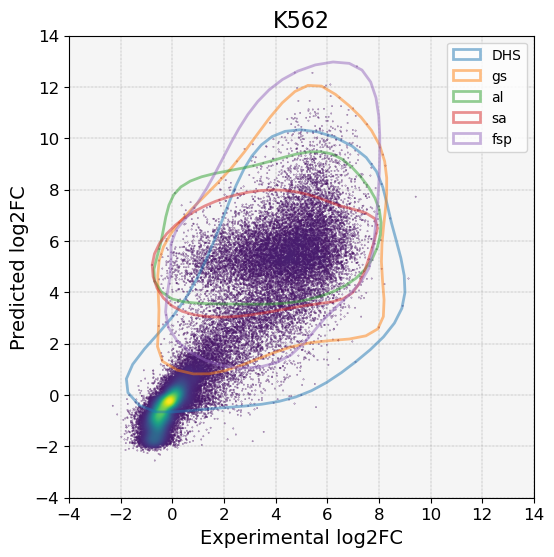

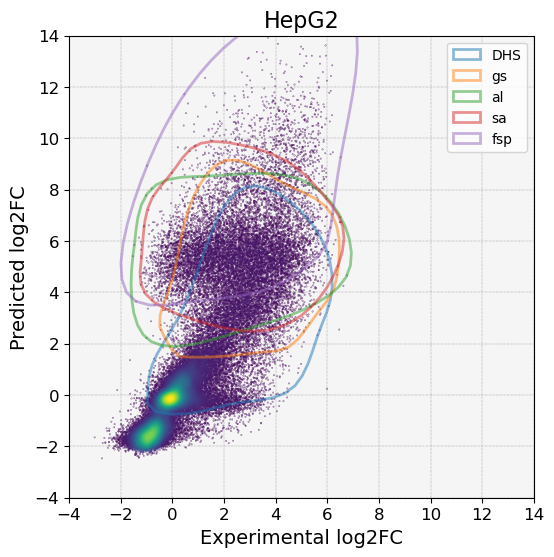

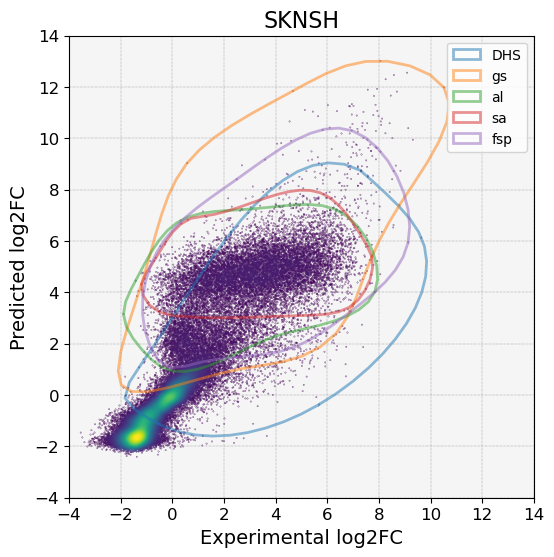

In [309]:
from scipy.spatial import ConvexHull
from scipy import interpolate

def encircle(x,y, ax=None, **kw):
    if not ax: ax=plt.gca()
    p = np.c_[x,y]
    hull = ConvexHull(p)
    poly = plt.Polygon(p[hull.vertices,:], **kw)
    ax.add_patch(poly)

def encircle2(x,y, ax=None, **kw):
    if not ax: ax=plt.gca()
    p = np.c_[x,y]
    mean = np.mean(p, axis=0)
    d = p-mean
    r = np.max(np.sqrt(d[:,0]**2+d[:,1]**2 ))
    circ = plt.Circle(mean, radius=1.05*r,**kw)
    ax.add_patch(circ)

all_methods = ['DHS', 'gs', 'al', 'sa', 'fsp']
cell_types = ['K562', 'HepG2', 'SKNSH']

row_filter = (boda2_df['method'].isin(all_methods)) & (boda2_df['round'] == 0)
plot_df = boda2_df[row_filter].copy()

quality_filter = (plot_df[['K562_lfcSE', 'HepG2_lfcSE', 'SKNSH_lfcSE']].max(axis=1) <= 1.0)
plot_df = plot_df[quality_filter].reset_index(drop=True)

custom_maps = [get_continuous_cmap(['#00A79D', '#73FFF6']),
               get_continuous_cmap(['#FBB040', '#FDDFB1']),
               get_continuous_cmap(['#ED1C24', '#F7A2A5'])]

fig_size = (6, 6)
for cmap_idx, cell_type in enumerate(cell_types):
    nonnan_filter = plot_df[f'{cell_type}_signal'].notnull()
    x, y = plot_df.loc[nonnan_filter][f'{cell_type}_signal'].to_numpy(), plot_df.loc[nonnan_filter][f'{cell_type}_pred_aggreg'].to_numpy()
    with plt.style.context('default'):
        fig, ax = plt.subplots(figsize=fig_size)  
        
        #--- Contours ---
        for j, method in enumerate(all_methods):
            contour_df = plot_df[(plot_df['method'] == method) & (plot_df['target_cell'] == cell_type.lower())]
            x_contour = contour_df[f'{cell_type}_signal'].to_numpy()
            y_contour = contour_df[f'{cell_type}_pred_aggreg'].to_numpy() 

            #encircle(x_contour, y_contour, ax=ax, ec=f'C{j}', fc=f'C{j}', alpha=0.2, label=method, fill=False, linewidth=5.0)
            points = np.c_[x_contour, y_contour]
            hull = ConvexHull(points)
            x_hull = np.append(points[hull.vertices,0],
                               points[hull.vertices,0][0])
            y_hull = np.append(points[hull.vertices,1],
                               points[hull.vertices,1][0])

            # interpolate
            dist = np.sqrt((x_hull[:-1] - x_hull[1:])**2 + (y_hull[:-1] - y_hull[1:])**2)
            dist_along = np.concatenate(([0], dist.cumsum()))
            spline, u = interpolate.splprep([x_hull, y_hull], 
                                            u=dist_along, s=0, per=1)
            interp_d = np.linspace(dist_along[0], dist_along[-1], 50)
            interp_x, interp_y = interpolate.splev(interp_d, spline)
            # plot shape
            plt.fill(interp_x, interp_y, '--', c=f'C{j}', alpha=0.5, label=method, fill=False, linewidth=2.0)

        #---
        
        #ax = density_scatter(x, y, bins=50, s=0.05, ax=ax, cmap=custom_maps[cmap_idx], alpha=1.0, figsize=fig_size)
        ax = density_scatter(x, y, bins=50, s=0.05, ax=ax, alpha=1.0, figsize=fig_size)
        ax.set_axisbelow(True)
        plt.grid(True, color = "grey", linewidth = "0.25", linestyle = "-.")
        

        
        plt.title(f'{cell_type}', fontsize=16)
        plt.xlabel('Experimental log2FC', fontsize=14)
        plt.ylabel('Predicted log2FC', fontsize=14)
        plt.xlim(-4, 14)
        plt.ylim(-4, 14)        
        plt.xticks(fontsize=12)
        plt.yticks(fontsize=12)
        ax.set_facecolor('whitesmoke')
        plt.legend()
        plt.show()

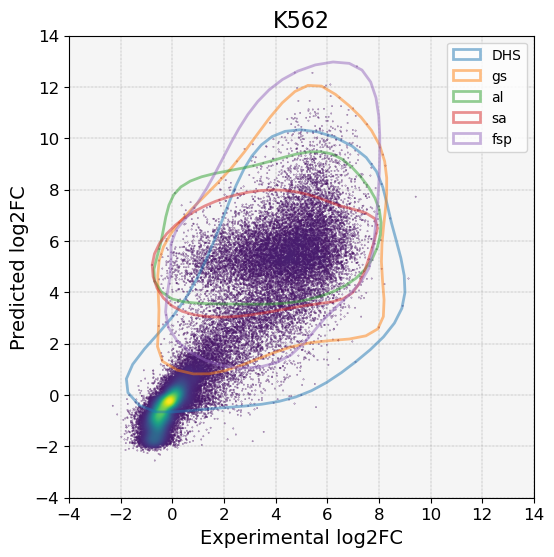

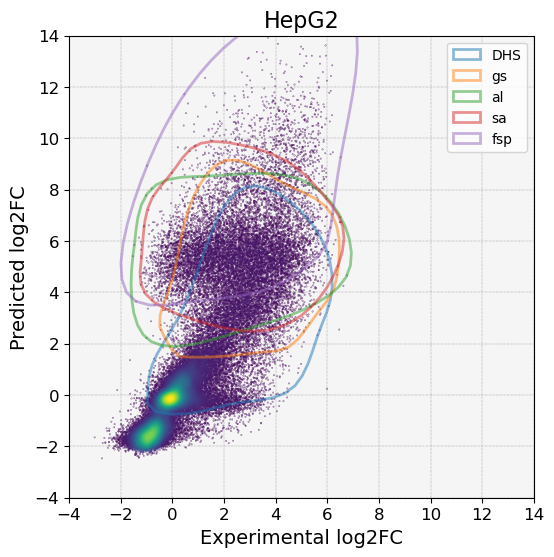

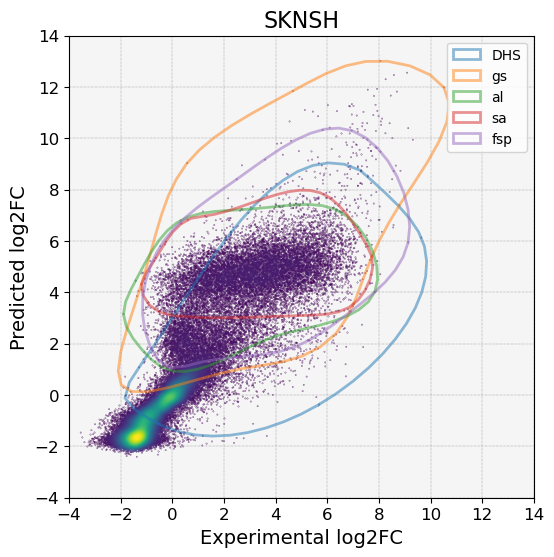

In [311]:
all_methods = ['DHS', 'gs', 'al', 'sa', 'fsp']
cell_types = ['K562', 'HepG2', 'SKNSH']

row_filter = (boda2_df['method'].isin(all_methods)) & (boda2_df['round'] == 0)
plot_df = boda2_df[row_filter].copy()

quality_filter = (plot_df[['K562_lfcSE', 'HepG2_lfcSE', 'SKNSH_lfcSE']].max(axis=1) <= 1.0)
plot_df = plot_df[quality_filter].reset_index(drop=True)

custom_maps = [get_continuous_cmap(['#00A79D', '#73FFF6']),
               get_continuous_cmap(['#FBB040', '#FDDFB1']),
               get_continuous_cmap(['#ED1C24', '#F7A2A5'])]

fig_size = (6, 6)
for cmap_idx, cell_type in enumerate(cell_types):
    nonnan_filter = plot_df[f'{cell_type}_signal'].notnull()
    x, y = plot_df.loc[nonnan_filter][f'{cell_type}_signal'].to_numpy(), plot_df.loc[nonnan_filter][f'{cell_type}_pred_aggreg'].to_numpy()
    with plt.style.context('default'):
        fig, ax = plt.subplots(figsize=fig_size)  
        
        #--- Contours ---
        for j, method in enumerate(all_methods):
            contour_df = plot_df[(plot_df['method'] == method) & (plot_df['target_cell'] == cell_type.lower())]
            x_contour = contour_df[f'{cell_type}_signal'].to_numpy()
            y_contour = contour_df[f'{cell_type}_pred_aggreg'].to_numpy() 
            points = np.c_[x_contour, y_contour]        
            #-- Hull
            hull = ConvexHull(points)
            x_hull = np.append(points[hull.vertices,0],
                               points[hull.vertices,0][0])
            y_hull = np.append(points[hull.vertices,1],
                               points[hull.vertices,1][0])
            #--- Interpolate
            dist = np.sqrt((x_hull[:-1] - x_hull[1:])**2 + (y_hull[:-1] - y_hull[1:])**2)
            dist_along = np.concatenate(([0], dist.cumsum()))
            spline, u = interpolate.splprep([x_hull, y_hull], 
                                            u=dist_along, s=0, per=1)
            interp_d = np.linspace(dist_along[0], dist_along[-1], 50)
            interp_x, interp_y = interpolate.splev(interp_d, spline)
            #--- Plot shape
            plt.fill(interp_x, interp_y, '--', c=f'C{j}', alpha=0.5, label=method, fill=False, linewidth=2.0)
        #---
        
        #ax = density_scatter(x, y, bins=50, s=0.05, ax=ax, cmap=custom_maps[cmap_idx], alpha=1.0, figsize=fig_size)
        ax = density_scatter(x, y, bins=50, s=0.05, ax=ax, alpha=1.0, figsize=fig_size)
        ax.set_axisbelow(True)
        plt.grid(True, color = "grey", linewidth = "0.25", linestyle = "-.")
        

        
        plt.title(f'{cell_type}', fontsize=16)
        plt.xlabel('Experimental log2FC', fontsize=14)
        plt.ylabel('Predicted log2FC', fontsize=14)
        plt.xlim(-4, 14)
        plt.ylim(-4, 14)        
        plt.xticks(fontsize=12)
        plt.yticks(fontsize=12)
        ax.set_facecolor('whitesmoke')
        plt.legend()
        plt.show()

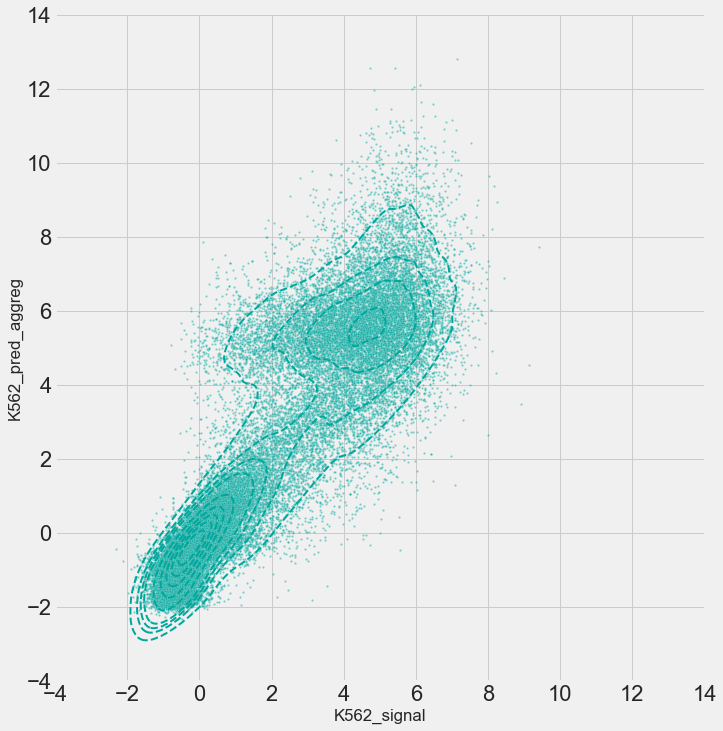

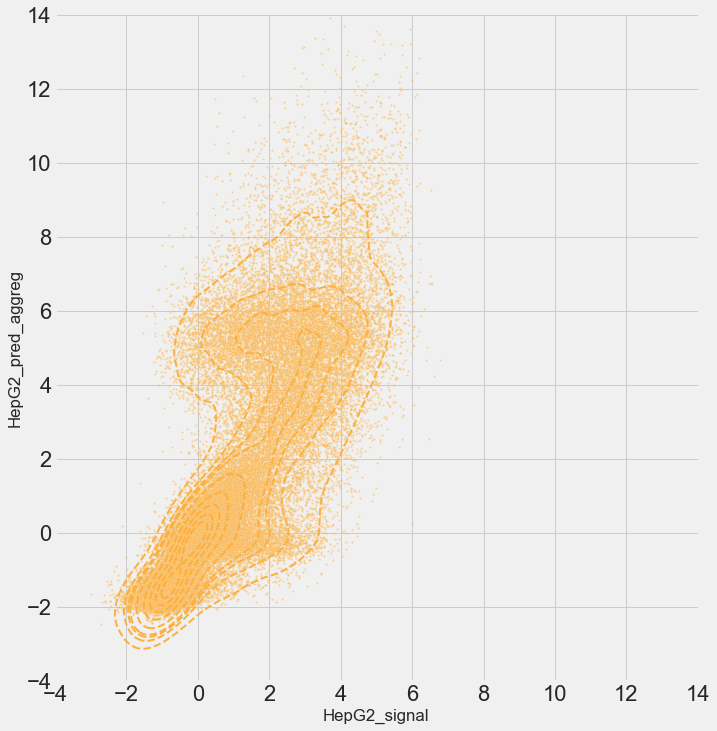

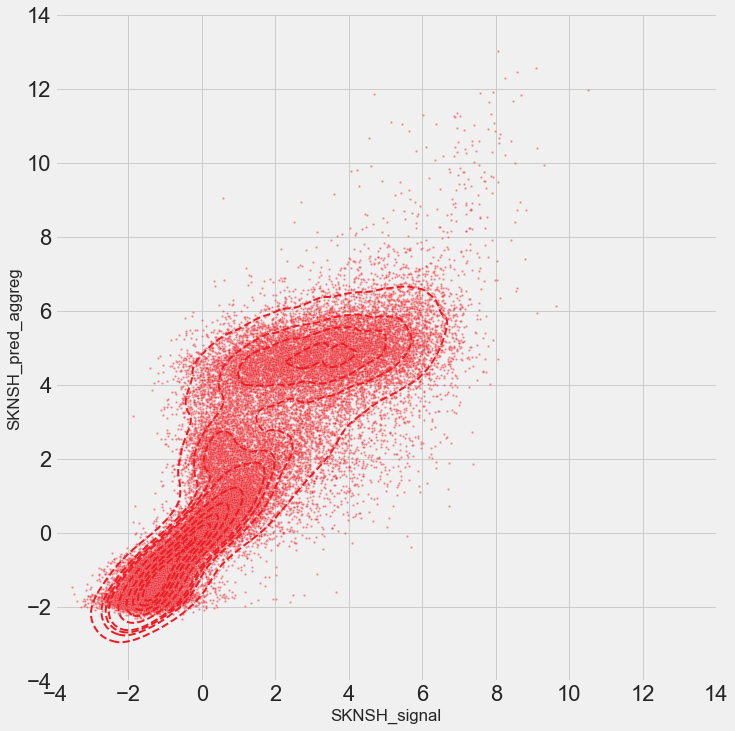

In [523]:
all_methods = ['DHS', 'gs', 'al', 'sa', 'fsp']
cell_types = ['K562', 'HepG2', 'SKNSH']
colors = ['#00A79D', '#FBB040', '#ED1C24']

row_filter = (boda2_df['method'].isin(all_methods)) & (boda2_df['round'] == 0)
plot_df = boda2_df[row_filter].copy()

quality_filter = (plot_df[['K562_lfcSE', 'HepG2_lfcSE', 'SKNSH_lfcSE']].max(axis=1) <= 1.0)
plot_df = plot_df[quality_filter].reset_index(drop=True)

for color_idx, cell_type in enumerate(cell_types):
    x_column = f'{cell_type}_signal'
    y_column = f'{cell_type}_pred_aggreg'
    with plt.style.context('fivethirtyeight'):
        mpl.rcParams['lines.linewidth'] = 2
        sns.relplot(data=plot_df, x=x_column, y=y_column, alpha=0.5, s=5.0, height=10, color= colors[color_idx])
        sns.kdeplot(data=plot_df, x=x_column, y=y_column, linestyles="--", color= colors[color_idx], shade=False)
        plt.xlim(-4, 14)
        plt.ylim(-4, 14)  
        plt.show()

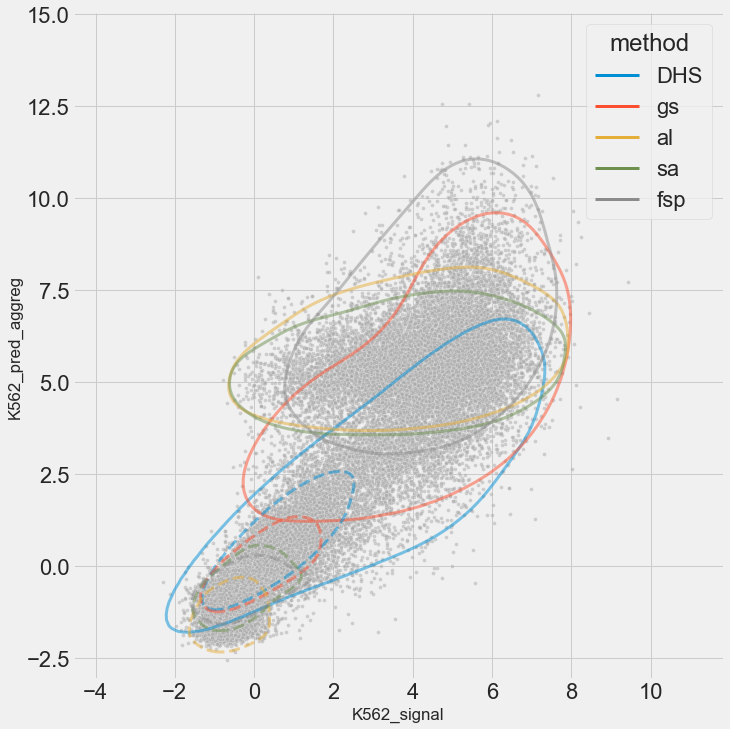

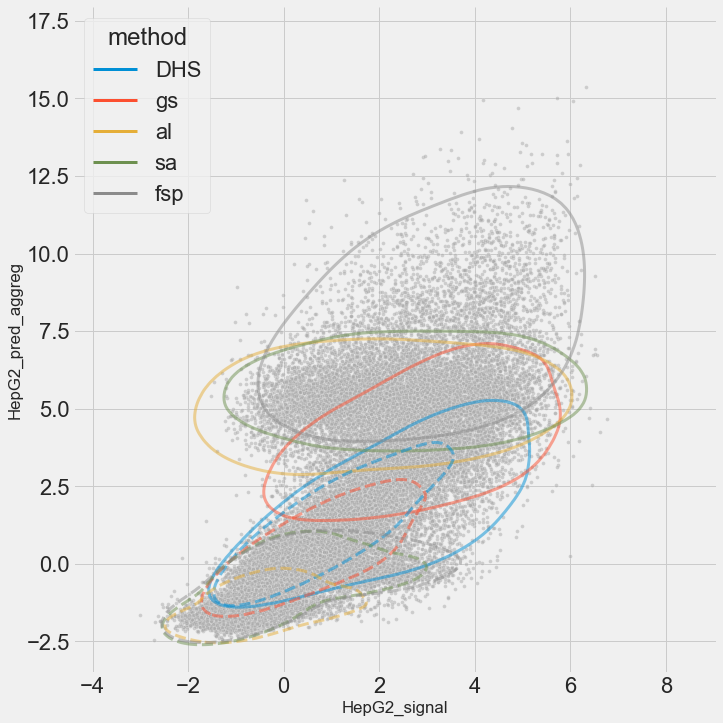

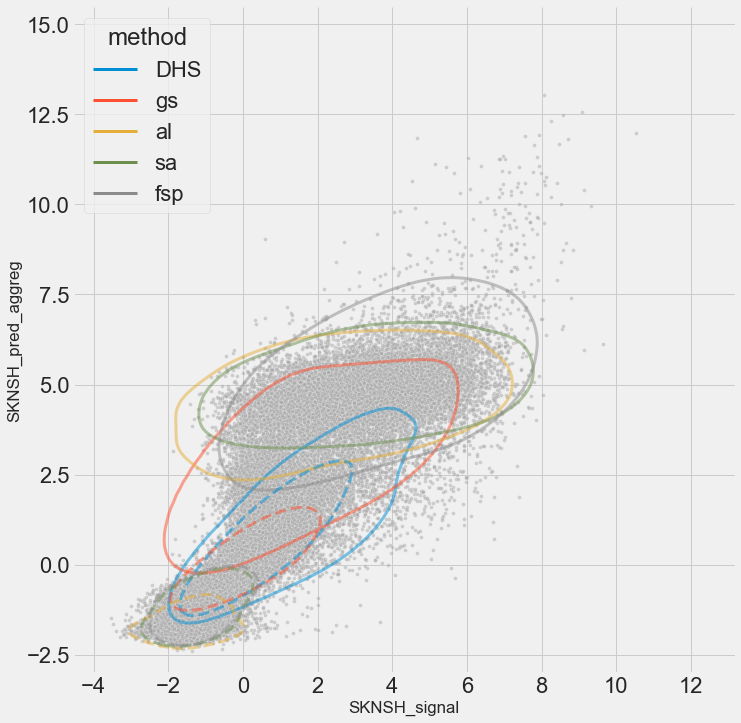

In [643]:
all_methods = ['DHS', 'gs', 'al', 'sa', 'fsp']
cell_types = ['K562', 'HepG2', 'SKNSH']
colors = ['#00A79D', '#FBB040', '#ED1C24']

row_filter = (boda2_df['method'].isin(all_methods)) & (boda2_df['round'] == 0)
plot_df = boda2_df[row_filter].copy()

quality_filter = (plot_df[['K562_lfcSE', 'HepG2_lfcSE', 'SKNSH_lfcSE']].max(axis=1) <= 1.0)
plot_df = plot_df[quality_filter].reset_index(drop=True)

for color_idx, cell_type in enumerate(cell_types):
    contour_df = plot_df[(plot_df['target_cell'] == cell_type.lower())]
    contour_non_df = plot_df[(plot_df['target_cell'] != cell_type.lower())]
    x_column = f'{cell_type}_signal'
    y_column = f'{cell_type}_pred_aggreg'
    with plt.style.context('fivethirtyeight'):
        mpl.rcParams['lines.linewidth'] = 3
        sns.relplot(data=plot_df, x=x_column, y=y_column, alpha=0.5, s=15.0, height=10, color= 'darkgrey')
        sns.kdeplot(data=contour_df, x=x_column, y=y_column, levels=np.array([0.05]), linestyles="-", hue='method', hue_order=all_methods, shade=False,
                   alpha=0.5, gridsize=100, bw_method=0.5)
        sns.kdeplot(data=contour_non_df, x=x_column, y=y_column, levels=np.array([0.05]), linestyles="--", hue='method', hue_order=all_methods, shade=False,
                    alpha=0.5, gridsize=100, bw_method=0.5)
        plt.show()

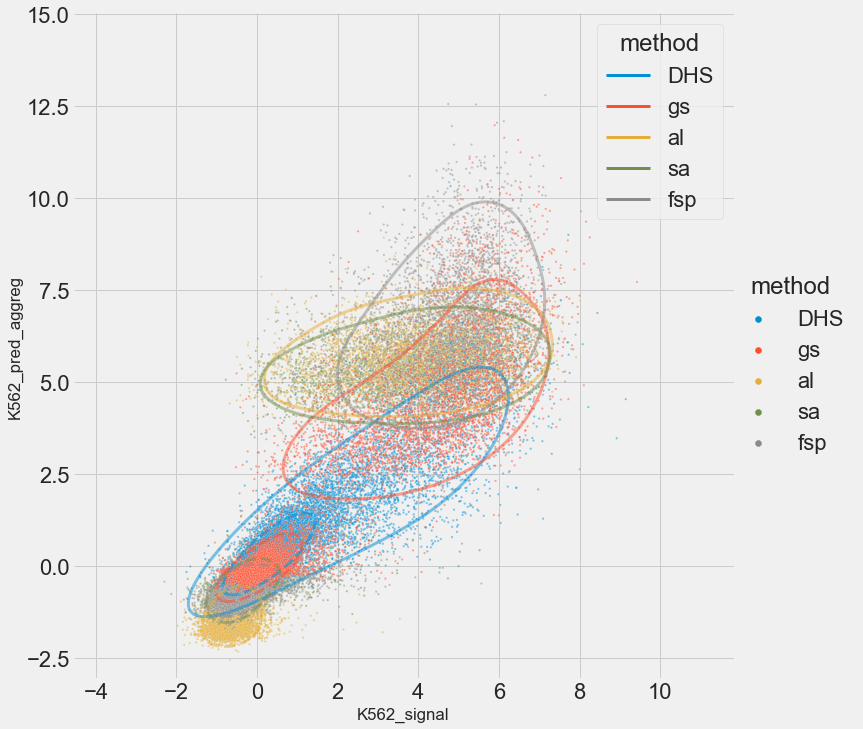

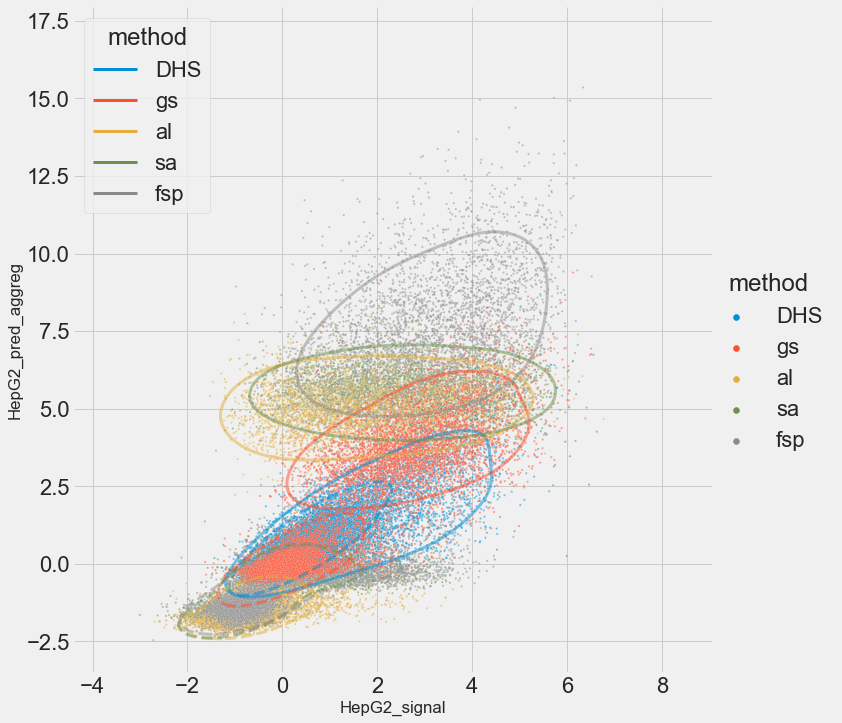

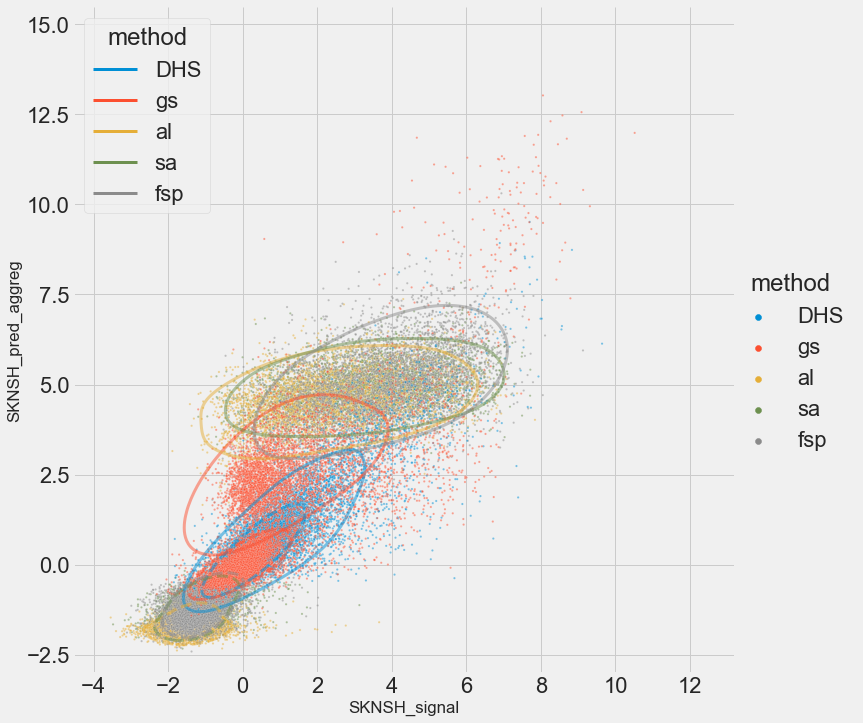

In [647]:
all_methods = ['DHS', 'gs', 'al', 'sa', 'fsp']
cell_types = ['K562', 'HepG2', 'SKNSH']
colors = ['#00A79D', '#FBB040', '#ED1C24']

row_filter = (boda2_df['method'].isin(all_methods)) & (boda2_df['round'] == 0)
plot_df = boda2_df[row_filter].copy()

quality_filter = (plot_df[['K562_lfcSE', 'HepG2_lfcSE', 'SKNSH_lfcSE']].max(axis=1) <= 1.0)
plot_df = plot_df[quality_filter].reset_index(drop=True)

for color_idx, cell_type in enumerate(cell_types):
    contour_df = plot_df[(plot_df['target_cell'] == cell_type.lower())]
    contour_non_df = plot_df[(plot_df['target_cell'] != cell_type.lower())]
    x_column = f'{cell_type}_signal'
    y_column = f'{cell_type}_pred_aggreg'
    with plt.style.context('fivethirtyeight'):
        mpl.rcParams['lines.linewidth'] = 3
        sns.relplot(data=plot_df, x=x_column, y=y_column, alpha=0.5, s=5.0, height=10, 
                    hue='method', hue_order=all_methods, color= 'darkgrey')
        sns.kdeplot(data=contour_df, x=x_column, y=y_column, levels=np.array([0.15]), linestyles="-", hue='method', hue_order=all_methods,
                    shade=False, bw_method=0.5, alpha=0.5)
        sns.kdeplot(data=contour_non_df, x=x_column, y=y_column, levels=np.array([0.15]), linestyles="--", hue='method', hue_order=all_methods,
                    shade=False, bw_method=0.5, alpha=0.5)
        plt.show()

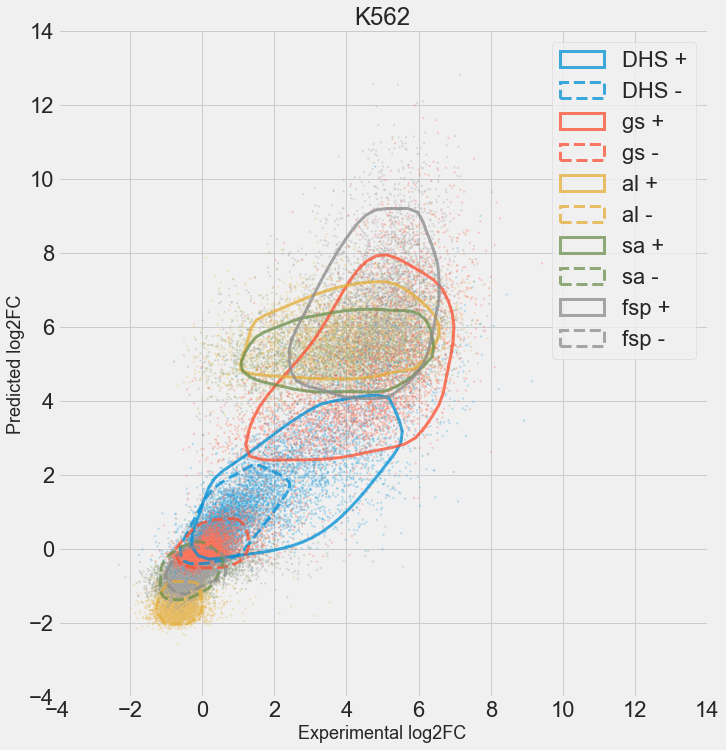

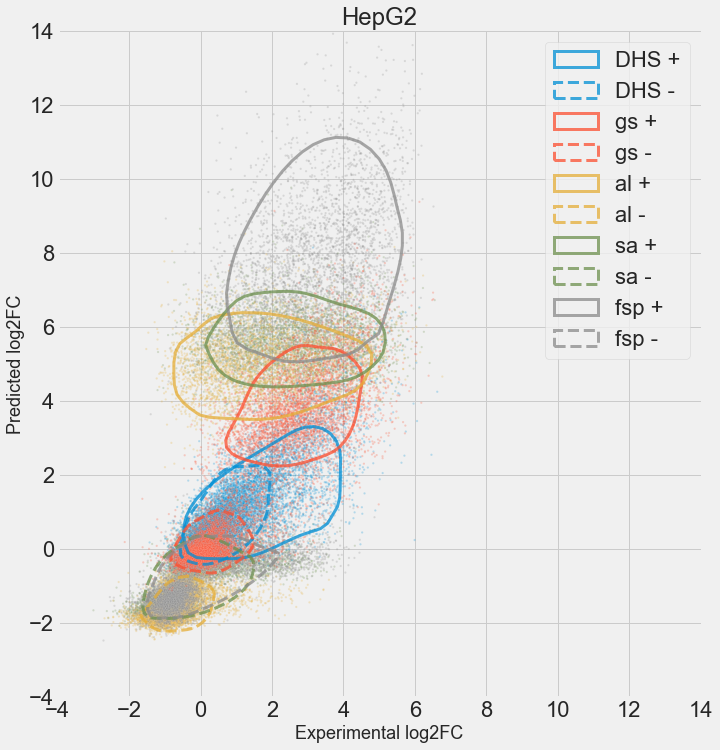

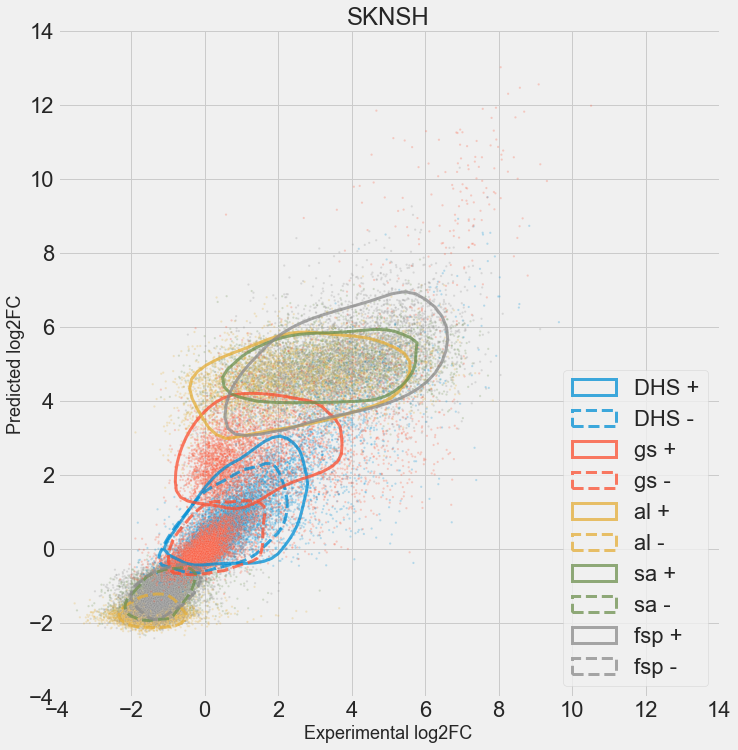

In [578]:
all_methods = ['DHS', 'gs', 'al', 'sa', 'fsp']
cell_types = ['K562', 'HepG2', 'SKNSH']
colors = ['#00A79D', '#FBB040', '#ED1C24']
fig_size = (10, 10)

row_filter = (boda2_df['method'].isin(all_methods)) & (boda2_df['round'] == 0)
plot_df = boda2_df[row_filter].copy()

quality_filter = (plot_df[['K562_lfcSE', 'HepG2_lfcSE', 'SKNSH_lfcSE']].max(axis=1) <= 1.0)
plot_df = plot_df[quality_filter].reset_index(drop=True)

for color_idx, cell_type in enumerate(cell_types):
    contour_df = plot_df[(plot_df['target_cell'] == cell_type.lower())]
    contour_non_df = plot_df[(plot_df['target_cell'] != cell_type.lower())]
    x_column = f'{cell_type}_signal'
    y_column = f'{cell_type}_pred_aggreg'
    
    x, y = plot_df[x_column].to_numpy(), plot_df[y_column].to_numpy()
    with plt.style.context('fivethirtyeight'):
        mpl.rcParams['lines.linewidth'] = 2
        sns.relplot(data=plot_df, x=x_column, y=y_column, alpha=0.25, s=5.0, height=10, hue='method', hue_order=all_methods, legend=False)#color= 'darkgrey')
        #sns.kdeplot(data=plot_df, x=x_column, y=y_column, linestyles="-", color= colors[color_idx], shade=False)
        #fig, ax = plt.subplots(figsize=fig_size)  
        #--- Contours ---
        for j, method in enumerate(all_methods):
            #--- TARGET CELL ----
            contour_df = plot_df[(plot_df['method'] == method) & (plot_df['target_cell'] == cell_type.lower())]
            x_contour = contour_df[f'{cell_type}_signal'].to_numpy()
            y_contour = contour_df[f'{cell_type}_pred_aggreg'].to_numpy() 
            points = np.c_[x_contour, y_contour]        
            
            #--- Filter outliers
            clf = IsolationForest(n_estimators=10, warm_start=True)
            clf.fit(points)  # fit 10 trees  
            clf.set_params(n_estimators=20)  # add 10 more trees  
            clf.fit(points)
            
            preds = clf.predict(points)
            points = points[preds == 1]
            
            #-- Hull
            hull = ConvexHull(points)
            x_hull = np.append(points[hull.vertices,0],
                               points[hull.vertices,0][0])
            y_hull = np.append(points[hull.vertices,1],
                               points[hull.vertices,1][0])
            #plt.fill(x_hull, y_hull, ls='-', c=f'C{j}', alpha=0.75, label=f'{method} +', fill=False, linewidth=3.0)
            
            #--- Interpolate
            dist = np.sqrt((x_hull[:-1] - x_hull[1:])**2 + (y_hull[:-1] - y_hull[1:])**2)
            dist_along = np.concatenate(([0], dist.cumsum()))
            spline, u = interpolate.splprep([x_hull, y_hull], 
                                            u=dist_along, s=0, per=1)
            interp_d = np.linspace(dist_along[0], dist_along[-1], 50)
            interp_x, interp_y = interpolate.splev(interp_d, spline)
            #--- Plot shape
            plt.fill(interp_x, interp_y, ls='-', c=f'C{j}', alpha=0.75, label=f'{method} +', fill=False, linewidth=3.0)
            
            #--- NON-TARGET CELLS ----
            non_contour_df = plot_df[(plot_df['method'] == method) & (plot_df['target_cell'] != cell_type.lower())]
            x_contour = non_contour_df[f'{cell_type}_signal'].to_numpy()
            y_contour = non_contour_df[f'{cell_type}_pred_aggreg'].to_numpy() 
            points = np.c_[x_contour, y_contour]        
            
            #--- Filter outliers
            clf = IsolationForest(n_estimators=10, warm_start=True)
            clf.fit(points)  # fit 10 trees  
            clf.set_params(n_estimators=20)  # add 10 more trees  
            clf.fit(points)
            
            preds = clf.predict(points)
            points = points[preds == 1]
            
            #-- Hull
            hull = ConvexHull(points)
            x_hull = np.append(points[hull.vertices,0],
                               points[hull.vertices,0][0])
            y_hull = np.append(points[hull.vertices,1],
                               points[hull.vertices,1][0])
            #plt.fill(x_hull, y_hull, ls=':', c=f'C{j}', alpha=0.75, label=f'{method} -', fill=False, linewidth=3.0)
            
            #--- Interpolate
            dist = np.sqrt((x_hull[:-1] - x_hull[1:])**2 + (y_hull[:-1] - y_hull[1:])**2)
            dist_along = np.concatenate(([0], dist.cumsum()))
            spline, u = interpolate.splprep([x_hull, y_hull], 
                                            u=dist_along, s=0, per=1)
            interp_d = np.linspace(dist_along[0], dist_along[-1], 50)
            interp_x, interp_y = interpolate.splev(interp_d, spline)
            #--- Plot shape
            plt.fill(interp_x, interp_y, ls='--', c=f'C{j}', alpha=0.75, label=f'{method} -', fill=False, linewidth=3.0)
        #---
        
        #ax = density_scatter(x, y, bins=50, s=0.05, ax=ax, cmap=custom_maps[cmap_idx], alpha=1.0, figsize=fig_size)
        #ax = density_scatter(x, y, bins=50, s=0.05, ax=ax, alpha=1.0, figsize=fig_size)
        #ax.scatter(x, y, s=1.0, alpha=0.5, color= 'darkgrey')
        #ax.set_axisbelow(True)
        
        #plt.grid(True, color = "grey", linewidth = "0.25", linestyle = "-.")
 
        plt.title(f'{cell_type}', fontsize=24)
        plt.xlabel('Experimental log2FC', fontsize=18)
        plt.ylabel('Predicted log2FC', fontsize=18)
        plt.xlim(-4, 14)
        plt.ylim(-4, 14)        
#         plt.xticks(fontsize=12)
#         plt.yticks(fontsize=12)
        #ax.set_facecolor('whitesmoke')
        plt.legend()
        plt.show()

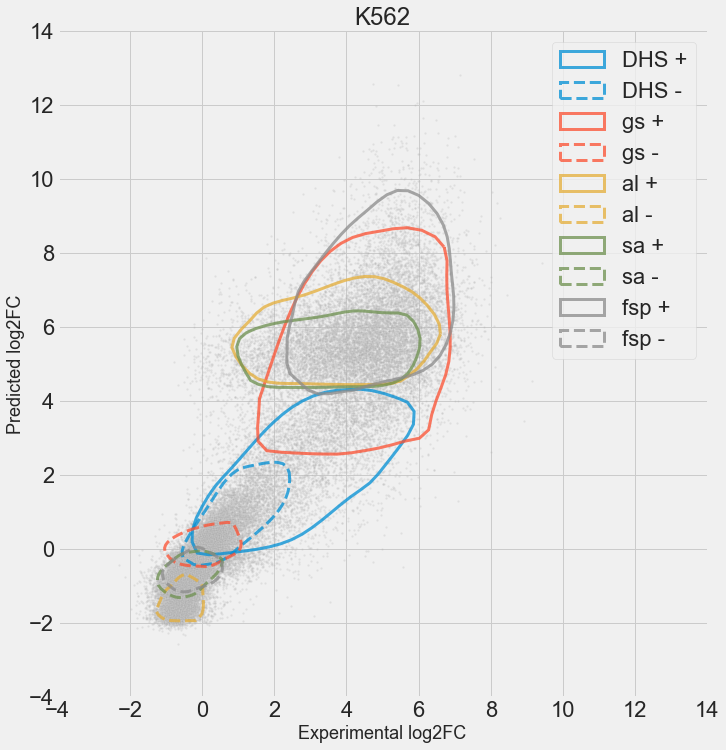

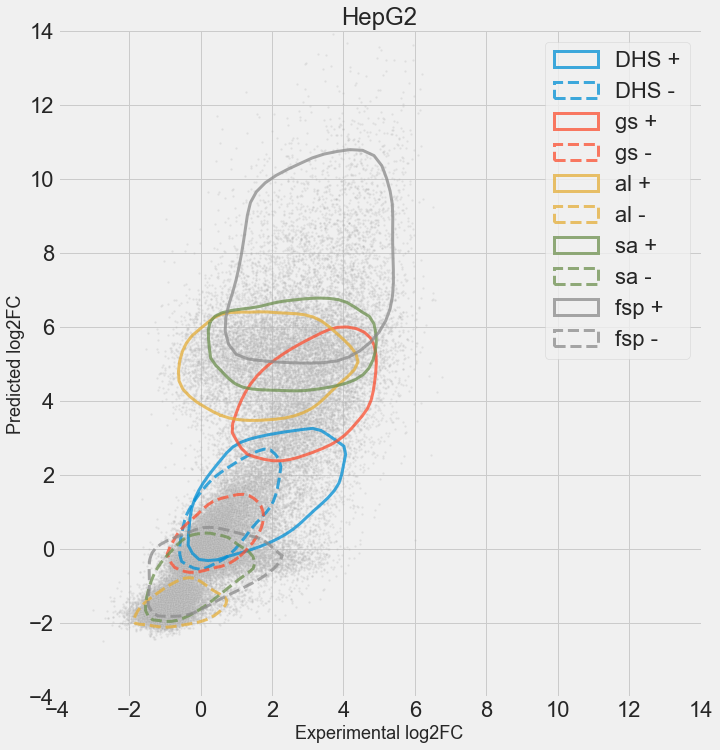

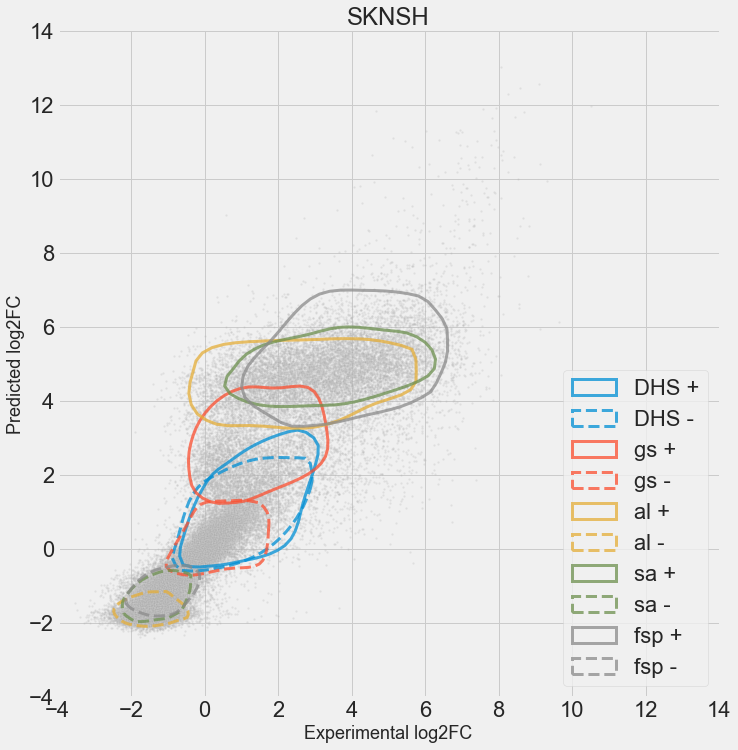

In [582]:
all_methods = ['DHS', 'gs', 'al', 'sa', 'fsp']
cell_types = ['K562', 'HepG2', 'SKNSH']
colors = ['#00A79D', '#FBB040', '#ED1C24']
fig_size = (10, 10)

row_filter = (boda2_df['method'].isin(all_methods)) & (boda2_df['round'] == 0)
plot_df = boda2_df[row_filter].copy()

quality_filter = (plot_df[['K562_lfcSE', 'HepG2_lfcSE', 'SKNSH_lfcSE']].max(axis=1) <= 1.0)
plot_df = plot_df[quality_filter].reset_index(drop=True)

for color_idx, cell_type in enumerate(cell_types):
    contour_df = plot_df[(plot_df['target_cell'] == cell_type.lower())]
    contour_non_df = plot_df[(plot_df['target_cell'] != cell_type.lower())]
    x_column = f'{cell_type}_signal'
    y_column = f'{cell_type}_pred_aggreg'
    
    x, y = plot_df[x_column].to_numpy(), plot_df[y_column].to_numpy()
    with plt.style.context('fivethirtyeight'):
        mpl.rcParams['lines.linewidth'] = 2
        sns.relplot(data=plot_df, x=x_column, y=y_column, alpha=0.25, s=5.0, height=10, color= 'darkgrey')
        #sns.kdeplot(data=plot_df, x=x_column, y=y_column, linestyles="-", color= colors[color_idx], shade=False)
        #fig, ax = plt.subplots(figsize=fig_size)  
        #--- Contours ---
        for j, method in enumerate(all_methods):
            #--- TARGET CELL ----
            contour_df = plot_df[(plot_df['method'] == method) & (plot_df['target_cell'] == cell_type.lower())]
            x_contour = contour_df[f'{cell_type}_signal'].to_numpy()
            y_contour = contour_df[f'{cell_type}_pred_aggreg'].to_numpy() 
            points = np.c_[x_contour, y_contour]        
            
            #--- Filter outliers
            clf = IsolationForest(n_estimators=20, warm_start=True)
            clf.fit(points)  # fit 10 trees  
#             clf.set_params(n_estimators=20)  # add 10 more trees  
#             clf.fit(points)
            
            preds = clf.predict(points)
            points = points[preds == 1]
            
            #-- Hull
            hull = ConvexHull(points)
            x_hull = np.append(points[hull.vertices,0],
                               points[hull.vertices,0][0])
            y_hull = np.append(points[hull.vertices,1],
                               points[hull.vertices,1][0])
            #plt.fill(x_hull, y_hull, ls='-', c=f'C{j}', alpha=0.75, label=f'{method} +', fill=False, linewidth=3.0)
            
            #--- Interpolate
            dist = np.sqrt((x_hull[:-1] - x_hull[1:])**2 + (y_hull[:-1] - y_hull[1:])**2)
            dist_along = np.concatenate(([0], dist.cumsum()))
            spline, u = interpolate.splprep([x_hull, y_hull], 
                                            u=dist_along, s=0, per=1)
            interp_d = np.linspace(dist_along[0], dist_along[-1], 50)
            interp_x, interp_y = interpolate.splev(interp_d, spline)
            #--- Plot shape
            plt.fill(interp_x, interp_y, ls='-', c=f'C{j}', alpha=0.75, label=f'{method} +', fill=False, linewidth=3.0)
            
            #--- NON-TARGET CELLS ----
            non_contour_df = plot_df[(plot_df['method'] == method) & (plot_df['target_cell'] != cell_type.lower())]
            x_contour = non_contour_df[f'{cell_type}_signal'].to_numpy()
            y_contour = non_contour_df[f'{cell_type}_pred_aggreg'].to_numpy() 
            points = np.c_[x_contour, y_contour]        
            
            #--- Filter outliers
            clf = IsolationForest(n_estimators=20, warm_start=True)
            clf.fit(points)  # fit 10 trees  
#             clf.set_params(n_estimators=20)  # add 10 more trees  
#             clf.fit(points)
            
            preds = clf.predict(points)
            points = points[preds == 1]
            
            #-- Hull
            hull = ConvexHull(points)
            x_hull = np.append(points[hull.vertices,0],
                               points[hull.vertices,0][0])
            y_hull = np.append(points[hull.vertices,1],
                               points[hull.vertices,1][0])
            #plt.fill(x_hull, y_hull, ls=':', c=f'C{j}', alpha=0.75, label=f'{method} -', fill=False, linewidth=3.0)
            
            #--- Interpolate
            dist = np.sqrt((x_hull[:-1] - x_hull[1:])**2 + (y_hull[:-1] - y_hull[1:])**2)
            dist_along = np.concatenate(([0], dist.cumsum()))
            spline, u = interpolate.splprep([x_hull, y_hull], 
                                            u=dist_along, s=0, per=1)
            interp_d = np.linspace(dist_along[0], dist_along[-1], 50)
            interp_x, interp_y = interpolate.splev(interp_d, spline)
            #--- Plot shape
            plt.fill(interp_x, interp_y, ls='--', c=f'C{j}', alpha=0.75, label=f'{method} -', fill=False, linewidth=3.0)
        #---
        
        #ax = density_scatter(x, y, bins=50, s=0.05, ax=ax, cmap=custom_maps[cmap_idx], alpha=1.0, figsize=fig_size)
        #ax = density_scatter(x, y, bins=50, s=0.05, ax=ax, alpha=1.0, figsize=fig_size)
        #ax.scatter(x, y, s=1.0, alpha=0.5, color= 'darkgrey')
        #ax.set_axisbelow(True)
        
        #plt.grid(True, color = "grey", linewidth = "0.25", linestyle = "-.")
 
        plt.title(f'{cell_type}', fontsize=24)
        plt.xlabel('Experimental log2FC', fontsize=18)
        plt.ylabel('Predicted log2FC', fontsize=18)
        plt.xlim(-4, 14)
        plt.ylim(-4, 14)        
#         plt.xticks(fontsize=12)
#         plt.yticks(fontsize=12)
        #ax.set_facecolor('whitesmoke')
        plt.legend()
        plt.show()

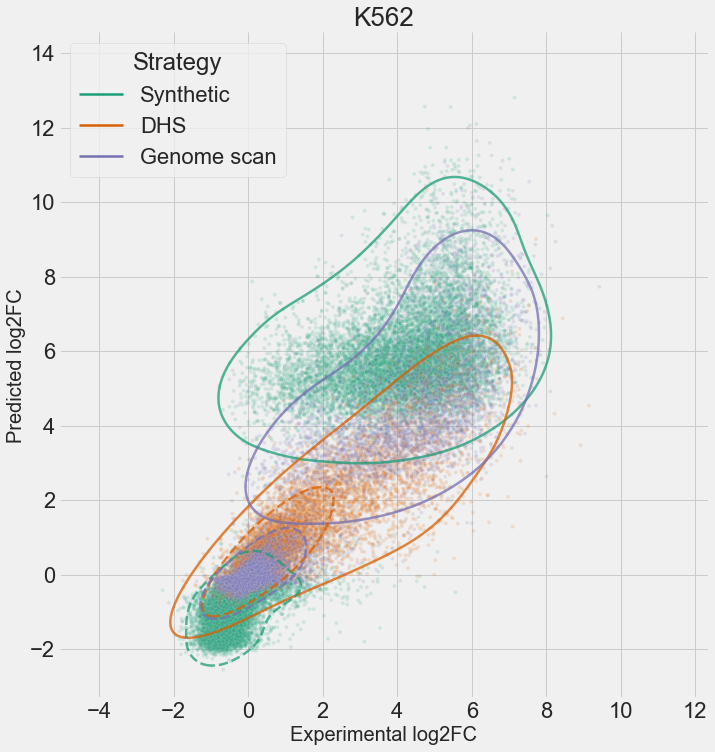

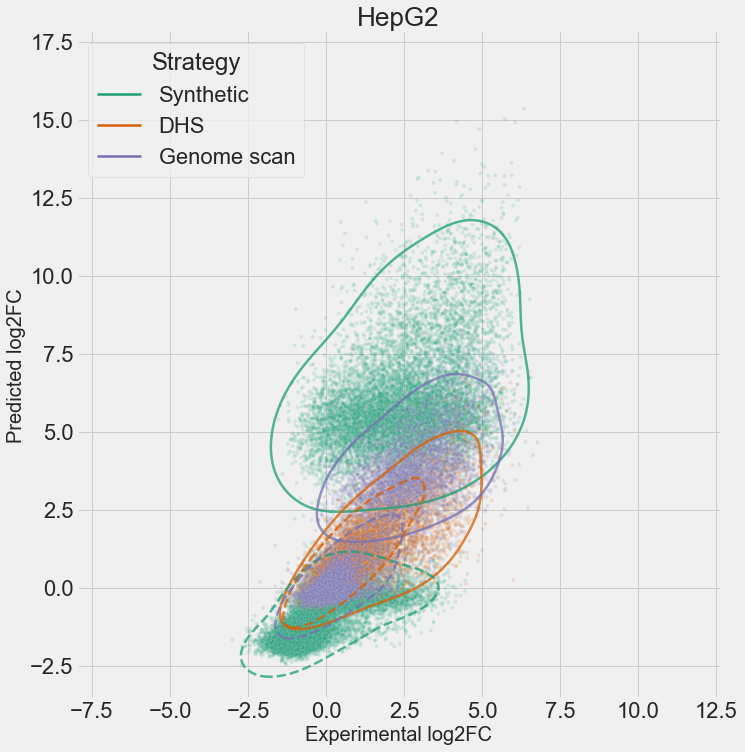

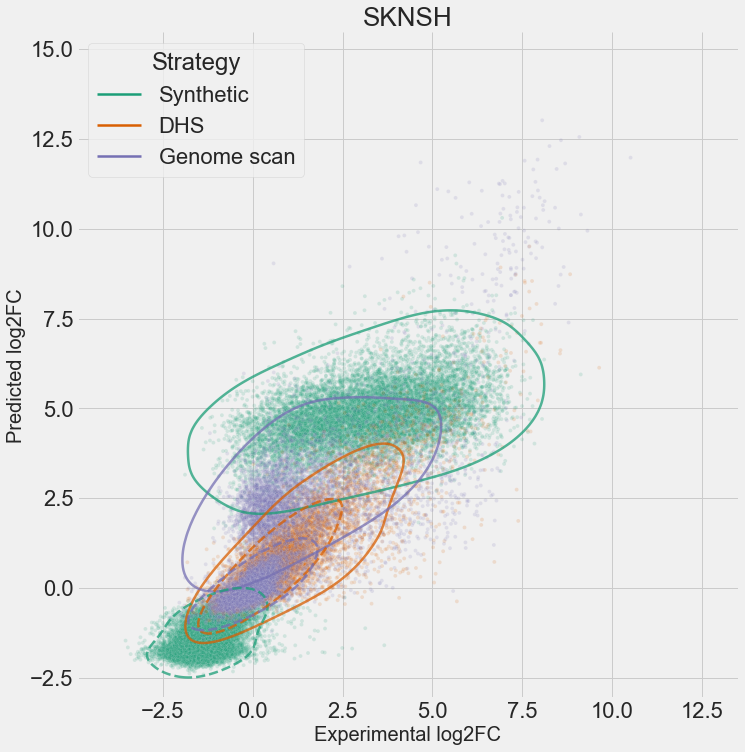

In [683]:
all_methods = ['DHS', 'gs', 'al', 'sa', 'fsp']
cell_types = ['K562', 'HepG2', 'SKNSH']
colors = ['#00A79D', '#FBB040', '#ED1C24']

row_filter = (boda2_df['method'].isin(all_methods)) & (boda2_df['round'] == 0)
plot_df = boda2_df[row_filter].copy()

quality_filter = (plot_df[['K562_lfcSE', 'HepG2_lfcSE', 'SKNSH_lfcSE']].max(axis=1) <= 1.0)
plot_df = plot_df[quality_filter].reset_index(drop=True)

plot_df.loc[plot_df['method'] == 'DHS', 'Strategy'] = 'DHS'
plot_df.loc[plot_df['method'] == 'gs', 'Strategy'] = 'Genome scan'
plot_df.loc[plot_df['method'].isin(['al', 'sa', 'fsp']), 'Strategy'] = 'Synthetic'

for color_idx, cell_type in enumerate(cell_types):
    contour_df = plot_df[(plot_df['target_cell'] == cell_type.lower())]
    contour_non_df = plot_df[(plot_df['target_cell'] != cell_type.lower())]
    x_column = f'{cell_type}_signal'
    y_column = f'{cell_type}_pred_aggreg'
    with plt.style.context('fivethirtyeight'):
        mpl.rcParams['lines.linewidth'] = 2.5
        sns.relplot(data=plot_df, x=x_column, y=y_column, alpha=0.15, s=15.0, height=10, #hue_order=all_methods, 
                    hue='Strategy', color= 'darkgrey', palette='Dark2', legend=False)
        sns.kdeplot(data=contour_df, x=x_column, y=y_column, levels=np.array([0.05]), linestyles="-", hue='Strategy', #hue_order=all_methods,
                    shade=False, bw_method=0.5, alpha=0.75, palette='Dark2')
        sns.kdeplot(data=contour_non_df, x=x_column, y=y_column, levels=np.array([0.05]), linestyles="--", hue='Strategy', #hue_order=all_methods,
                    shade=False, bw_method=0.5, alpha=0.75, palette='Dark2')
        plt.xlabel('Experimental log2FC', fontsize=20)
        plt.ylabel('Predicted log2FC', fontsize=20)
        plt.title(cell_type, fontsize=26)
        plt.axis('equal')
        plt.show()

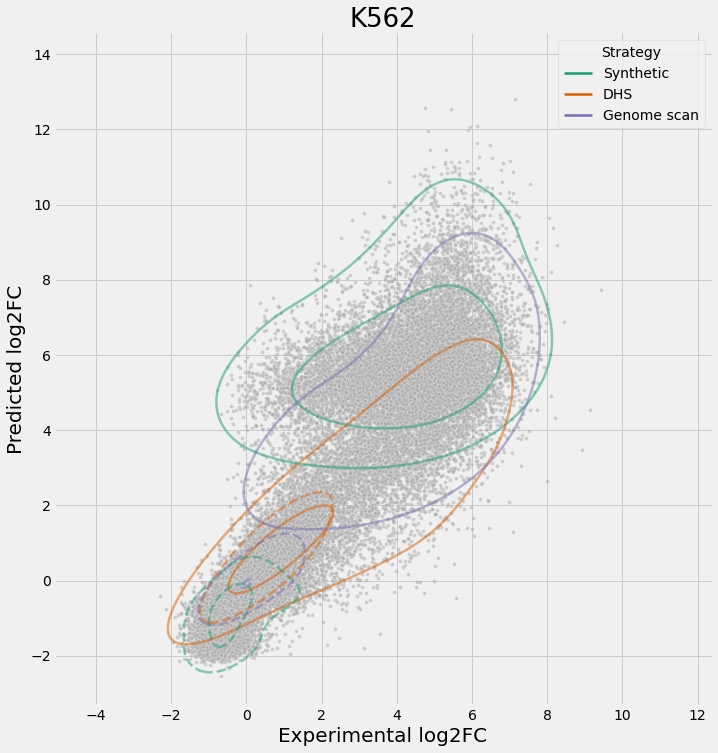

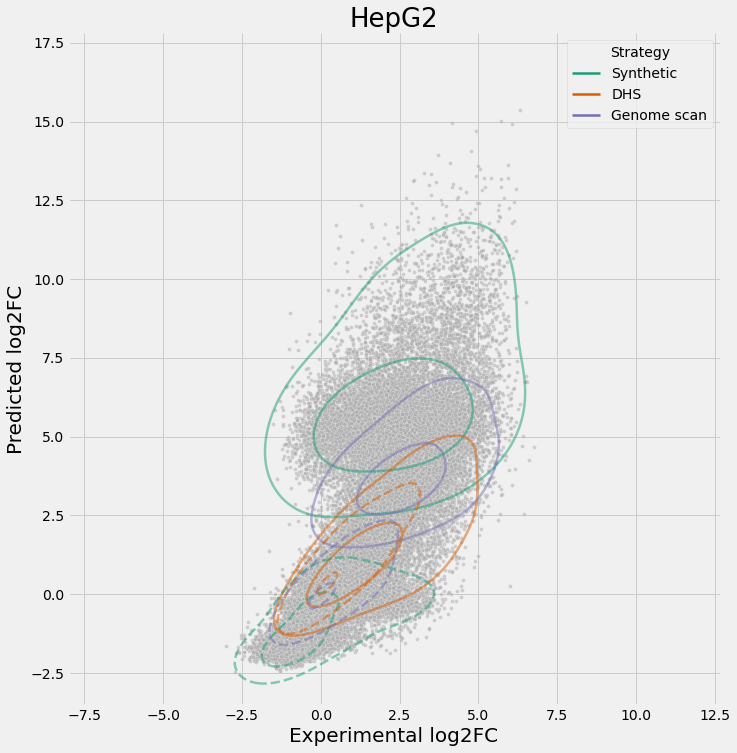

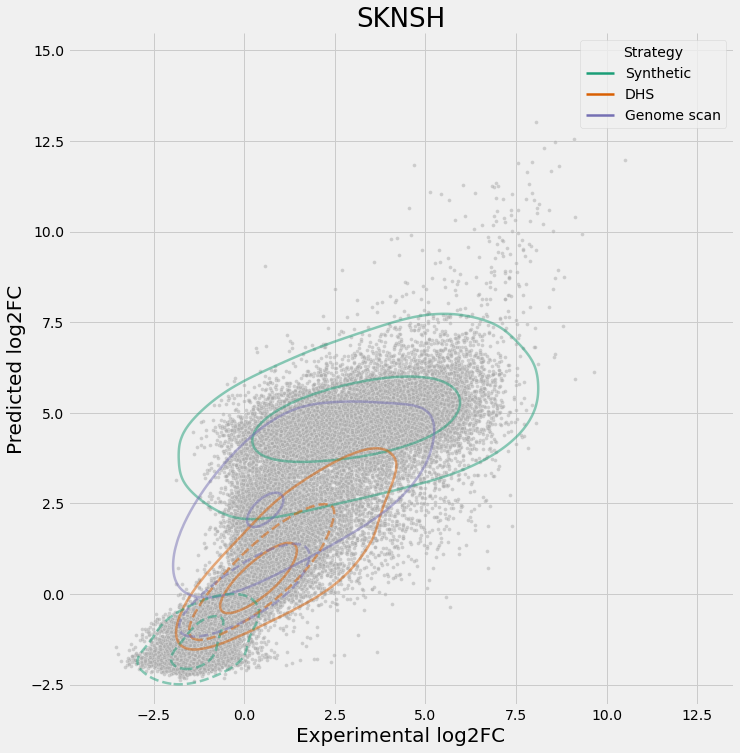

In [4]:
all_methods = ['DHS', 'gs', 'al', 'sa', 'fsp']
cell_types = ['K562', 'HepG2', 'SKNSH']
colors = ['#00A79D', '#FBB040', '#ED1C24']

row_filter = (boda2_df['method'].isin(all_methods)) & (boda2_df['round'] == 0)
plot_df = boda2_df[row_filter].copy()

quality_filter = (plot_df[['K562_lfcSE', 'HepG2_lfcSE', 'SKNSH_lfcSE']].max(axis=1) <= 1.0)
plot_df = plot_df[quality_filter].reset_index(drop=True)

plot_df.loc[plot_df['method'] == 'DHS', 'Strategy'] = 'DHS'
plot_df.loc[plot_df['method'] == 'gs', 'Strategy'] = 'Genome scan'
plot_df.loc[plot_df['method'].isin(['al', 'sa', 'fsp']), 'Strategy'] = 'Synthetic'

for color_idx, cell_type in enumerate(cell_types):
    contour_df = plot_df[(plot_df['target_cell'] == cell_type.lower())]
    contour_non_df = plot_df[(plot_df['target_cell'] != cell_type.lower())]
    x_column = f'{cell_type}_signal'
    y_column = f'{cell_type}_pred_aggreg'
    with plt.style.context('fivethirtyeight'):
        mpl.rcParams['lines.linewidth'] = 2.5
        sns.relplot(data=plot_df, x=x_column, y=y_column, alpha=0.5, s=15.0, height=10, #hue_order=all_methods, hue='sequence_type', 
                    color= 'darkgrey', palette='Dark2', legend=False)
        sns.kdeplot(data=contour_df, x=x_column, y=y_column, levels=np.array([0.05, 0.5]), linestyles="-", hue='Strategy', #hue_order=all_methods,
                    shade=False, bw_method=0.5, alpha=0.5, palette='Dark2')
        sns.kdeplot(data=contour_non_df, x=x_column, y=y_column, levels=np.array([0.05, 0.5]), linestyles="--", hue='Strategy', #hue_order=all_methods,
                    shade=False, bw_method=0.5, alpha=0.5, palette='Dark2')
        plt.xlabel('Experimental log2FC', fontsize=20)
        plt.ylabel('Predicted log2FC', fontsize=20)
        plt.title(cell_type, fontsize=26)
        plt.axis('equal')
        plt.show()

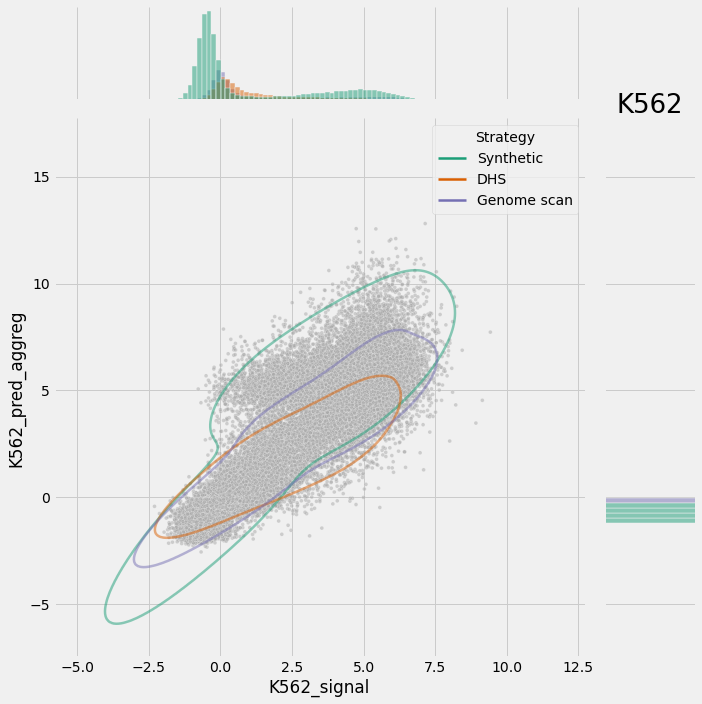

In [67]:
from matplotlib.colors import ListedColormap

all_methods = ['DHS', 'gs', 'al', 'sa', 'fsp']
cell_types = ['K562', 'HepG2', 'SKNSH']
colors = ['#00A79D', '#FBB040', '#ED1C24']

customPalette = sns.color_palette(3*['darkgrey'])

row_filter = (boda2_df['method'].isin(all_methods)) & (boda2_df['round'] == 0)
plot_df = boda2_df[row_filter].copy()

quality_filter = (plot_df[['K562_lfcSE', 'HepG2_lfcSE', 'SKNSH_lfcSE']].max(axis=1) <= 1.0)
plot_df = plot_df[quality_filter].reset_index(drop=True)

plot_df.loc[plot_df['method'] == 'DHS', 'Strategy'] = 'DHS'
plot_df.loc[plot_df['method'] == 'gs', 'Strategy'] = 'Genome scan'
plot_df.loc[plot_df['method'].isin(['al', 'sa', 'fsp']), 'Strategy'] = 'Synthetic'

for color_idx, cell_type in enumerate(cell_types[:1]):
    contour_df = plot_df[(plot_df['target_cell'] == cell_type.lower())]
    contour_non_df = plot_df[(plot_df['target_cell'] != cell_type.lower())]
    x_column = f'{cell_type}_signal'
    y_column = f'{cell_type}_pred_aggreg'
    with plt.style.context('fivethirtyeight'):
        mpl.rcParams['lines.linewidth'] = 2.5
        g = sns.JointGrid(data=plot_df, x=x_column, y=y_column, hue='Strategy', height=10,)#alpha=0.5, s=15.0,  
                    #color= 'darkgrey', palette='Dark2', legend=True)
        g.plot_joint(sns.scatterplot, alpha=0.5, palette=customPalette, s=15.0, legend=False)
        g.plot_joint(sns.kdeplot, data=contour_df, alpha=0.5, palette='Dark2', levels=np.array([0.05]), bw_method=0.5,
                    legend=True)
        g.plot_marginals(sns.histplot, palette='Dark2')
#         sns.kdeplot(data=contour_df, x=x_column, y=y_column, levels=np.array([0.05, 0.5]), linestyles="-", hue='Strategy', #hue_order=all_methods,
#                     shade=False, bw_method=0.5, alpha=0.5, palette='Dark2')
#         sns.kdeplot(data=contour_non_df, x=x_column, y=y_column, levels=np.array([0.05, 0.5]), linestyles="--", hue='Strategy', #hue_order=all_methods,
#                     shade=False, bw_method=0.5, alpha=0.5, palette='Dark2')
        plt.xlabel('Experimental log2FC', fontsize=20)
        plt.ylabel('Predicted log2FC', fontsize=20)
        plt.title(cell_type, fontsize=26)
        plt.axis('equal')
        plt.show()

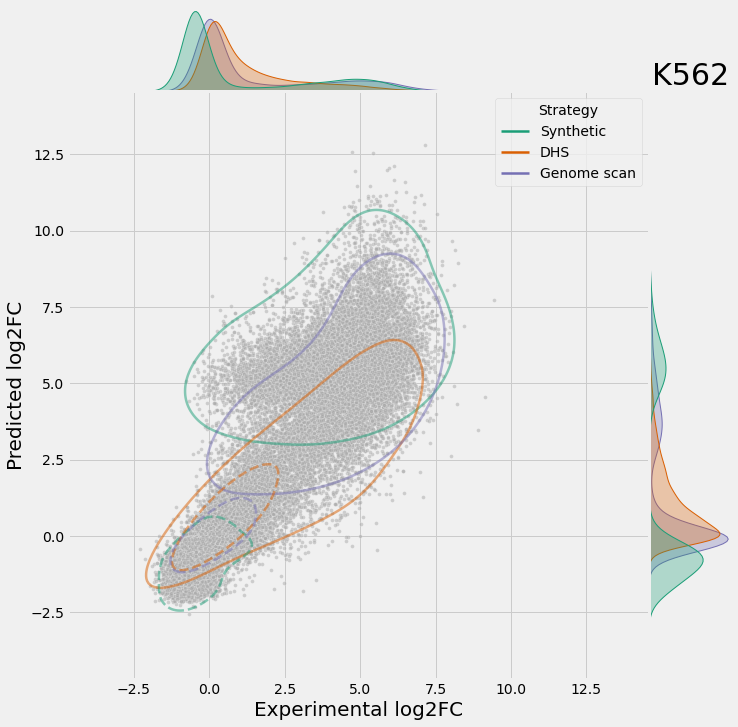

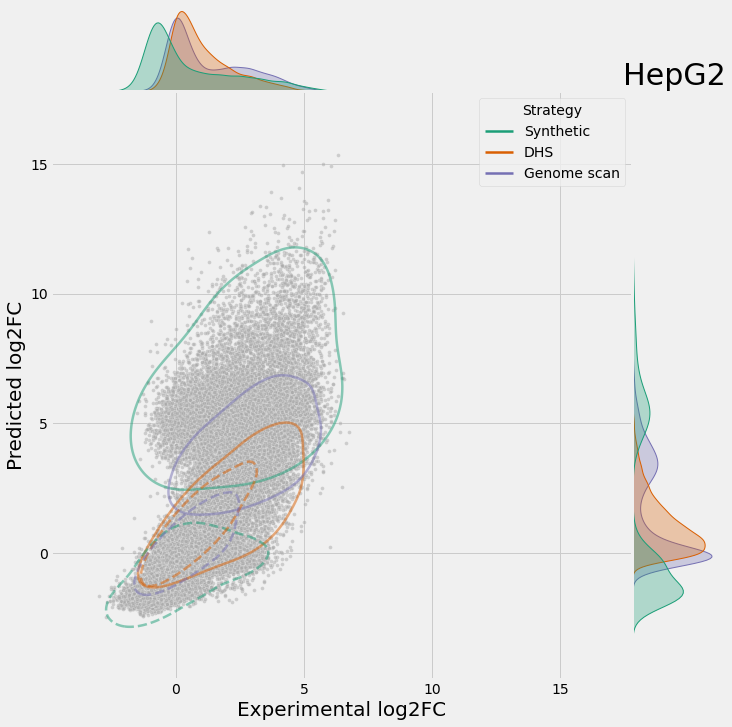

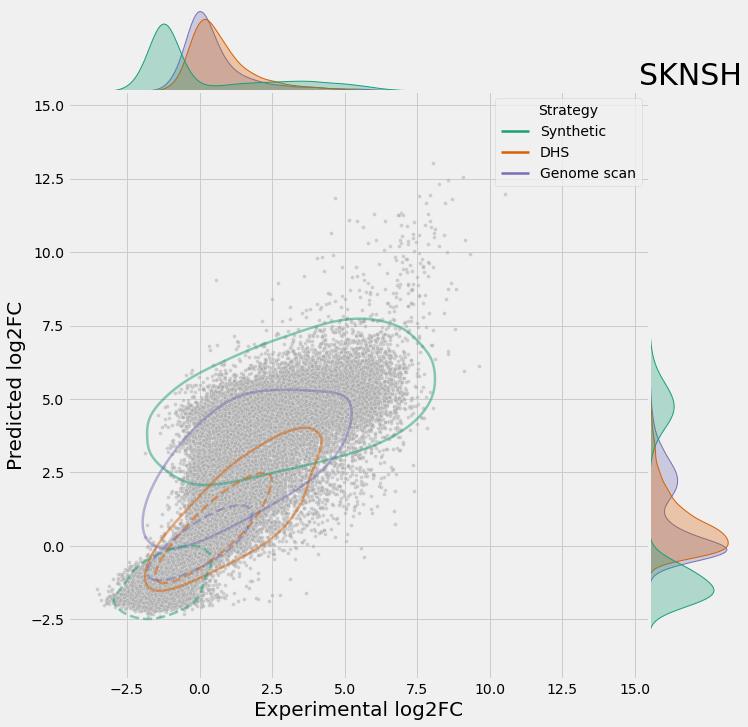

In [207]:
all_methods = ['DHS', 'gs', 'al', 'sa', 'fsp']
cell_types = ['K562', 'HepG2', 'SKNSH']
colors = ['#00A79D', '#FBB040', '#ED1C24']

customPalette = sns.color_palette(3*['darkgrey'])

row_filter = (boda2_df['method'].isin(all_methods)) & (boda2_df['round'] == 0)
plot_df = boda2_df[row_filter].copy()

quality_filter = (plot_df[['K562_lfcSE', 'HepG2_lfcSE', 'SKNSH_lfcSE']].max(axis=1) <= 1.0)
plot_df = plot_df[quality_filter].reset_index(drop=True)

plot_df.loc[plot_df['method'] == 'DHS', 'Strategy'] = 'DHS'
plot_df.loc[plot_df['method'] == 'gs', 'Strategy'] = 'Genome scan'
plot_df.loc[plot_df['method'].isin(['al', 'sa', 'fsp']), 'Strategy'] = 'Synthetic'

for color_idx, cell_type in enumerate(cell_types[:3]):
    contour_df = plot_df[(plot_df['target_cell'] == cell_type.lower())]
    contour_non_df = plot_df[(plot_df['target_cell'] != cell_type.lower())]
#     contour_df.loc[:, 'Strategy'] = 'Target ' + contour_df['Strategy'].astype(str)
#     contour_non_df[:, 'Strategy'] = 'Non-target ' + contour_non_df['Strategy'].astype(str)
    x_column = f'{cell_type}_signal'
    y_column = f'{cell_type}_pred_aggreg'
    with plt.style.context('fivethirtyeight'):
    #with plt.style.context('ggplot'):
        mpl.rcParams['lines.linewidth'] = 2.5
        g = sns.JointGrid(height=10, ratio=7, space=0.0, marginal_ticks=False)
        #--- joint
        sns.scatterplot(data=plot_df, x=x_column, y=y_column, alpha=0.5, color='darkgrey', s=15.0,
                        legend=False, ax=g.ax_joint)
        sns.kdeplot(data=contour_df, x=x_column, y=y_column, levels=np.array([0.05]), linestyles="-", hue='Strategy',
                    shade=False, bw_method=0.5, alpha=0.5, palette='Dark2', ax=g.ax_joint, legend=True)       
        sns.kdeplot(data=contour_non_df, x=x_column, y=y_column, levels=np.array([0.05]), linestyles="--", hue='Strategy',
                    shade=False, bw_method=0.5, alpha=0.5, palette='Dark2', ax=g.ax_joint, legend=True)
        #--- margins
        sns.kdeplot(data=plot_df, x=x_column, hue='Strategy', alpha=0.3, palette='Dark2', linewidth=1,
                    ax=g.ax_marg_x, legend=False, shade=True, multiple="layer", common_grid=False, common_norm=False)
        sns.kdeplot(data=plot_df, y=y_column, hue='Strategy', alpha=0.3, palette='Dark2', linewidth=1,
                    ax=g.ax_marg_y, legend=False, shade=True, multiple="layer", common_grid=False, common_norm=False)
        min_lim = min(g.ax_joint.get_xlim()[0], g.ax_joint.get_ylim()[0])
        max_lim = max(g.ax_joint.get_xlim()[1], g.ax_joint.get_ylim()[1])
        g.ax_joint.set_xlim(min_lim, max_lim)
        g.ax_joint.set_ylim(min_lim, max_lim)

    #         legend_properties = {'weight':'bold','size':8, 'linestyles': '--'}
        #g.ax_joint.legend(labels=['a', 'b', 'c'])
        #g.ax_joint.get_legend().set_title('Chi')
        #plt.legend(labels=[str(i) for i in range(6)])

        g.ax_joint.set_xlabel('Experimental log2FC', fontsize=20)
        g.ax_joint.set_ylabel('Predicted log2FC', fontsize=20)
        #g.ax_marg_x.set_title(cell_type, fontsize=26)
        plt.title(cell_type, fontsize=30)
        g.ax_marg_x.grid(False)
        g.ax_marg_y.grid(False)
        plt.show()

In [6]:
all_methods = ['DHS', 'gs', 'al', 'sa', 'fsp']
cell_types = ['K562', 'HepG2', 'SKNSH']
colors = ['#00A79D', '#FBB040', '#ED1C24']

#customPalette = 'Dark2'
#customPalette = sns.color_palette(3*['darkgrey'])
customPalette = sns.color_palette(['#FF6D79', '#FFB2E6', '#57954A', '#33D15B'])


row_filter = (boda2_df['method'].isin(all_methods)) & (boda2_df['round'] == 0)
row_filter_2 = (boda2_df['method'] == 'fsp') & (boda2_df['round'] > 0)
plot_df = boda2_df[row_filter | row_filter_2].copy()

quality_filter = (plot_df[['K562_lfcSE', 'HepG2_lfcSE', 'SKNSH_lfcSE']].max(axis=1) <= 1.0)
plot_df = plot_df[quality_filter].reset_index(drop=True)

plot_df.loc[plot_df['method'] == 'DHS', 'Strategy'] = 'DHS-natural'
plot_df.loc[plot_df['method'] == 'gs', 'Strategy'] = 'Malinois-natural'
plot_df.loc[(plot_df['method'].isin(['al', 'sa', 'fsp']) & (plot_df['round'] == 0)), 'Strategy'] = 'Synthetic'
plot_df.loc[(plot_df['method'].isin(['fsp']) & (plot_df['round'] > 0)), 'Strategy'] = 'Synthetic penalized'

pearsons = []
spearmans = []
for color_idx, cell_type in enumerate(cell_types[:3]):
    contour_df = plot_df[(plot_df['target_cell'] == cell_type.lower())]
    contour_non_df = plot_df[(plot_df['target_cell'] != cell_type.lower())]
#     contour_df.loc[:, 'Strategy'] = 'Target ' + contour_df['Strategy'].astype(str)
#     contour_non_df[:, 'Strategy'] = 'Non-target ' + contour_non_df['Strategy'].astype(str)
    x_column = f'{cell_type}_signal'
    y_column = f'{cell_type}_pred_aggreg'
    
    pearsons.append(stats.pearsonr(plot_df[x_column].to_numpy(), plot_df[y_column].to_numpy())[0])
    spearmans.append(stats.spearmanr(plot_df[x_column].to_numpy(), plot_df[y_column].to_numpy())[0])
print(pearsons)
print(spearmans)
print(np.mean(pearsons), np.mean(spearmans))

[0.9083828301050991, 0.7923673766460271, 0.8846375061605994]
[0.8961134967926654, 0.8421474217562703, 0.9213321688737685]
0.8617959043039085 0.8865310291409014


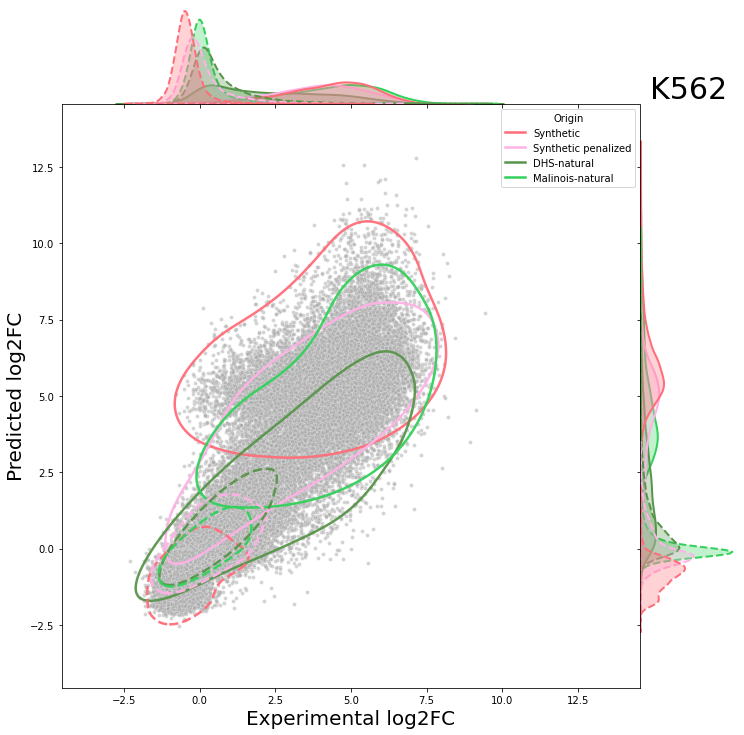

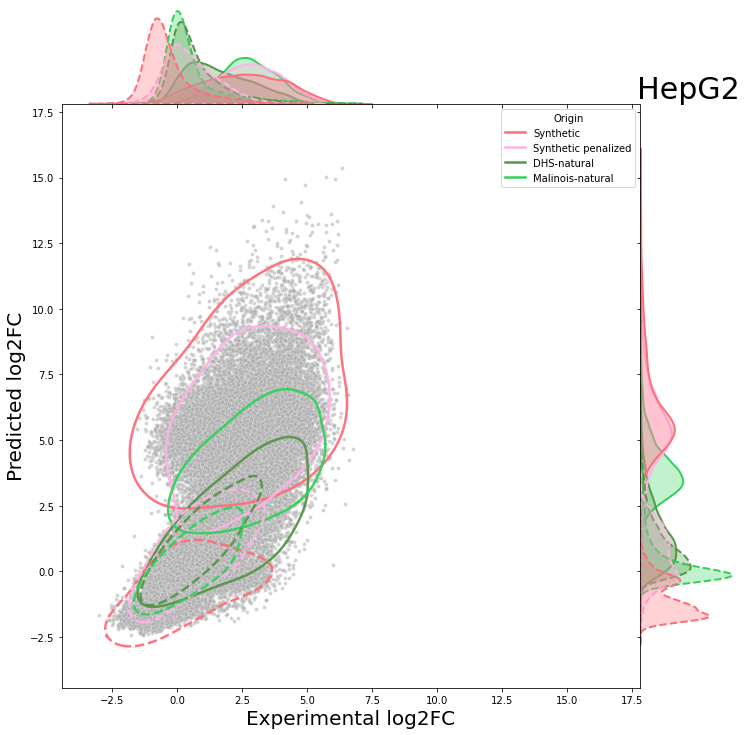

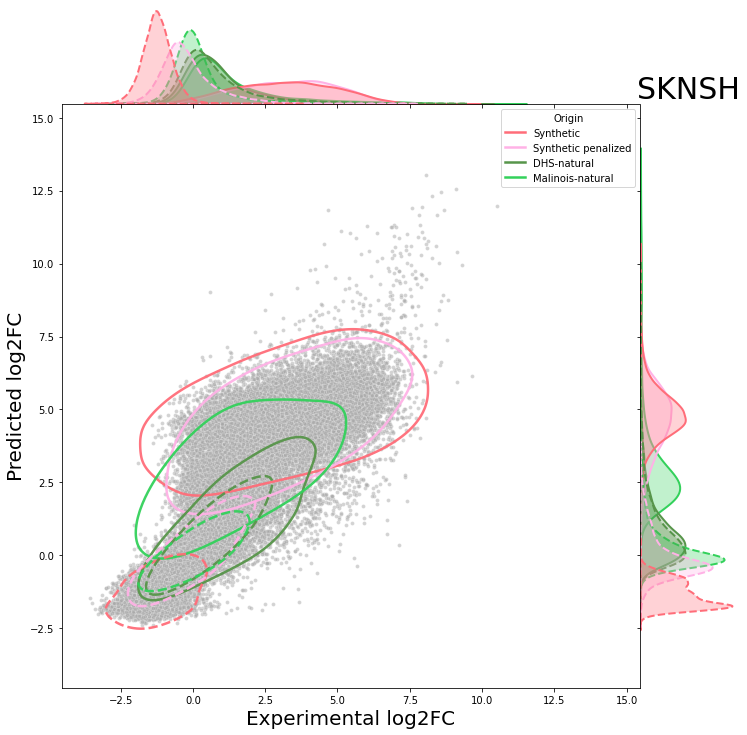

In [11]:
all_methods = ['DHS', 'gs', 'al', 'sa', 'fsp']
cell_types = ['K562', 'HepG2', 'SKNSH']
colors = ['#00A79D', '#FBB040', '#ED1C24']

#customPalette = 'Dark2'
#customPalette = sns.color_palette(3*['darkgrey'])
customPalette = sns.color_palette(['#FF6D79', '#FFB2E6', '#57954A', '#33D15B'])


row_filter = (boda2_df['method'].isin(all_methods)) & (boda2_df['round'] == 0)
row_filter_2 = (boda2_df['method'] == 'fsp') & (boda2_df['round'] > 0)
plot_df = boda2_df[row_filter | row_filter_2].copy()

quality_filter = (plot_df[['K562_lfcSE', 'HepG2_lfcSE', 'SKNSH_lfcSE']].max(axis=1) <= 1.0)
plot_df = plot_df[quality_filter].reset_index(drop=True)

plot_df.loc[plot_df['method'] == 'DHS', 'Strategy'] = 'DHS-natural'
plot_df.loc[plot_df['method'] == 'gs', 'Strategy'] = 'Malinois-natural'
plot_df.loc[(plot_df['method'].isin(['al', 'sa', 'fsp']) & (plot_df['round'] == 0)), 'Strategy'] = 'Synthetic'
plot_df.loc[(plot_df['method'].isin(['fsp']) & (plot_df['round'] > 0)), 'Strategy'] = 'Synthetic penalized'

for color_idx, cell_type in enumerate(cell_types[:3]):
    contour_df = plot_df[(plot_df['target_cell'] == cell_type.lower())]
    contour_non_df = plot_df[(plot_df['target_cell'] != cell_type.lower())]
#     contour_df.loc[:, 'Strategy'] = 'Target ' + contour_df['Strategy'].astype(str)
#     contour_non_df[:, 'Strategy'] = 'Non-target ' + contour_non_df['Strategy'].astype(str)
    x_column = f'{cell_type}_signal'
    y_column = f'{cell_type}_pred_aggreg'
    
    pearson = stats.pearsonr(plot_df[x_column].to_numpy(), plot_df[y_column].to_numpy())[0]
    spearman = stats.spearmanr(plot_df[x_column].to_numpy(), plot_df[y_column].to_numpy())[0]
    print(pearson, spearman)

    #with plt.style.context('fivethirtyeight'):
    with plt.style.context('fast'):
        mpl.rcParams['lines.linewidth'] = 2.5
        g = sns.JointGrid(height=10, ratio=6, space=0.0, marginal_ticks=False)
        #--- joint
        sns.scatterplot(data=plot_df, x=x_column, y=y_column, alpha=0.5, color='darkgrey', s=15.0,
                        legend=False, ax=g.ax_joint, rasterized=True)
        sns.kdeplot(data=contour_df, x=x_column, y=y_column, levels=np.array([0.05]), linestyles="-", hue='Strategy',
                    shade=False, bw_method=0.5, alpha=0.95, palette=customPalette, ax=g.ax_joint, legend=True)       
        sns.kdeplot(data=contour_non_df, x=x_column, y=y_column, levels=np.array([0.05]), linestyles="--", hue='Strategy',
                    shade=False, bw_method=0.5, alpha=0.95, palette=customPalette, ax=g.ax_joint, legend=True)
        #--- margins
        sns.kdeplot(data=contour_df, x=x_column, hue='Strategy', alpha=0.3, palette=customPalette, linewidth=2,
                    ax=g.ax_marg_x, legend=False, shade=True, multiple="layer", common_grid=False, common_norm=False)
        sns.kdeplot(data=contour_df, y=y_column, hue='Strategy', alpha=0.3, palette=customPalette, linewidth=2,
                    ax=g.ax_marg_y, legend=False, shade=True, multiple="layer", common_grid=False, common_norm=False)
        sns.kdeplot(data=contour_non_df, x=x_column, hue='Strategy', alpha=0.3, palette=customPalette, linewidth=2, linestyle='--',
                    ax=g.ax_marg_x, legend=False, shade=True, multiple="layer", common_grid=False, common_norm=False)
        sns.kdeplot(data=contour_non_df, y=y_column, hue='Strategy', alpha=0.3, palette=customPalette, linewidth=2, linestyle='--',
                    ax=g.ax_marg_y, legend=False, shade=True, multiple="layer", common_grid=False, common_norm=False)
        min_lim = min(g.ax_joint.get_xlim()[0], g.ax_joint.get_ylim()[0])
        max_lim = max(g.ax_joint.get_xlim()[1], g.ax_joint.get_ylim()[1])
        g.ax_joint.set_xlim(min_lim, max_lim)
        g.ax_joint.set_ylim(min_lim, max_lim)

#         legend_properties = {'weight':'bold', 'size':8}
#         g.ax_joint.legend(prop=legend_properties)
        #g.ax_joint.get_legend().set_title(f'{cell_type} target')
        g.ax_joint.get_legend().set_title(f'Origin')
        #plt.legend(labels=[str(i) for i in range(6)])

        g.ax_joint.set_xlabel('Experimental log2FC', fontsize=20)
        g.ax_joint.set_ylabel('Predicted log2FC', fontsize=20)
        #g.ax_marg_x.set_title(cell_type, fontsize=26)
        plt.title(cell_type, fontsize=30)
        g.ax_marg_x.grid(False)
        g.ax_marg_y.grid(False)
        savepath = f'./figures/boda2_library_prediction_scatter__{cell_type}_v2.pdf'
        #plt.savefig(savepath, format='pdf', transparent=True, dpi=300, bbox_inches='tight')
        plt.show()

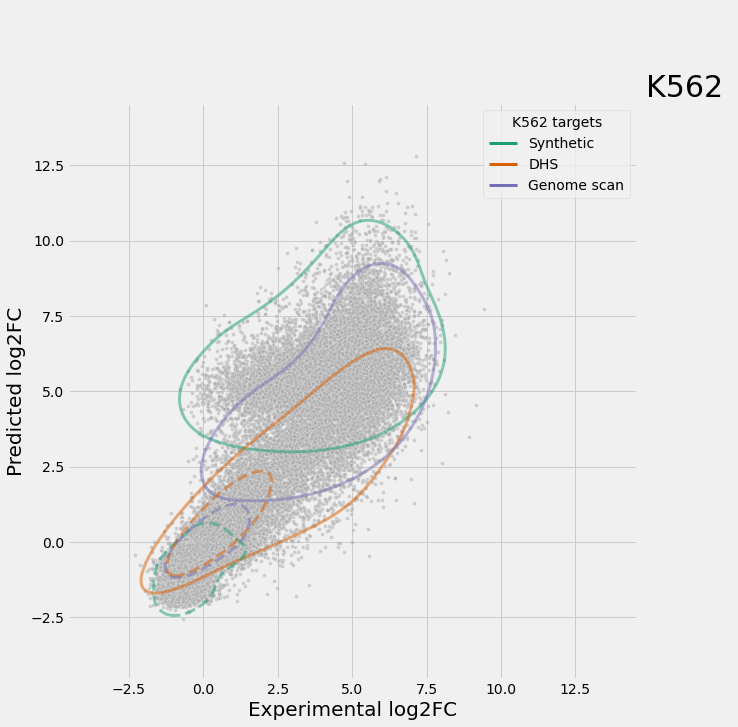

In [81]:
all_methods = ['DHS', 'gs', 'al', 'sa', 'fsp']
cell_types = ['K562', 'HepG2', 'SKNSH']
colors = ['#00A79D', '#FBB040', '#ED1C24']

customPalette = sns.color_palette(3*['darkgrey'])

row_filter = (boda2_df['method'].isin(all_methods)) & (boda2_df['round'] == 0)
plot_df = boda2_df[row_filter].copy()

quality_filter = (plot_df[['K562_lfcSE', 'HepG2_lfcSE', 'SKNSH_lfcSE']].max(axis=1) <= 1.0)
plot_df = plot_df[quality_filter].reset_index(drop=True)

plot_df.loc[plot_df['method'] == 'DHS', 'Strategy'] = 'DHS'
plot_df.loc[plot_df['method'] == 'gs', 'Strategy'] = 'Genome scan'
plot_df.loc[plot_df['method'].isin(['al', 'sa', 'fsp']), 'Strategy'] = 'Synthetic'

for color_idx, cell_type in enumerate(cell_types[:1]):
    contour_df = plot_df[(plot_df['target_cell'] == cell_type.lower())]
    contour_non_df = plot_df[(plot_df['target_cell'] != cell_type.lower())]
#     contour_df.loc[:, 'Strategy'] = 'Target ' + contour_df['Strategy'].astype(str)
#     contour_non_df[:, 'Strategy'] = 'Non-target ' + contour_non_df['Strategy'].astype(str)
    x_column = f'{cell_type}_signal'
    y_column = f'{cell_type}_pred_aggreg'
    with plt.style.context('fivethirtyeight'):
    #with plt.style.context('ggplot'):
        mpl.rcParams['lines.linewidth'] = 3
        g = sns.JointGrid(height=10, ratio=6, space=0.0, marginal_ticks=False)
        #--- joint
        sns.scatterplot(data=plot_df, x=x_column, y=y_column, alpha=0.5, color='darkgrey', s=15.0,
                        legend=False, ax=g.ax_joint)
        sns.kdeplot(data=contour_df, x=x_column, y=y_column, levels=np.array([0.05]), linestyles="-", hue='Strategy', label='Target', 
                    shade=False, bw_method=0.5, alpha=0.5, palette='Dark2', ax=g.ax_joint, legend=True)    
        running_handles = g.ax_joint.__dict__['legend_'].__dict__['legendHandles']
        sns.kdeplot(data=contour_non_df, x=x_column, y=y_column, levels=np.array([0.05]), linestyles="--", hue='Strategy', label='Non-target', 
                    shade=False, bw_method=0.5, alpha=0.5, palette='Dark2', ax=g.ax_joint, legend=True)
        running_handles += g.ax_joint.__dict__['legend_'].__dict__['legendHandles']
        
        g.ax_joint.__dict__['legend_'].__dict__['legendHandles'] = running_handles
        g.ax_joint.__dict__['legend_'].__dict__['texts'] = 2 * g.ax_joint.__dict__['legend_'].__dict__['texts']
        
        #--- margins
#         sns.kdeplot(data=contour_df, x=x_column, hue='Strategy', alpha=0.3, palette='Dark2', linewidth=2,
#                     ax=g.ax_marg_x, legend=False, shade=True, multiple="layer", common_grid=False, common_norm=False)
#         sns.kdeplot(data=contour_df, y=y_column, hue='Strategy', alpha=0.3, palette='Dark2', linewidth=2,
#                     ax=g.ax_marg_y, legend=False, shade=True, multiple="layer", common_grid=False, common_norm=False)
#         sns.kdeplot(data=contour_non_df, x=x_column, hue='Strategy', alpha=0.3, palette='Dark2', linewidth=2, linestyle='--',
#                     ax=g.ax_marg_x, legend=False, shade=True, multiple="layer", common_grid=False, common_norm=False)
#         sns.kdeplot(data=contour_non_df, y=y_column, hue='Strategy', alpha=0.3, palette='Dark2', linewidth=2, linestyle='--',
#                     ax=g.ax_marg_y, legend=False, shade=True, multiple="layer", common_grid=False, common_norm=False)
        min_lim = min(g.ax_joint.get_xlim()[0], g.ax_joint.get_ylim()[0])
        max_lim = max(g.ax_joint.get_xlim()[1], g.ax_joint.get_ylim()[1])
        g.ax_joint.set_xlim(min_lim, max_lim)
        g.ax_joint.set_ylim(min_lim, max_lim)

#         legend_properties = {'weight':'bold', 'size':8}
#         g.ax_joint.legend(prop=legend_properties)
        g.ax_joint.get_legend().set_title(f'{cell_type} targets')
        #plt.legend(labels=[str(i) for i in range(6)])

        g.ax_joint.set_xlabel('Experimental log2FC', fontsize=20)
        g.ax_joint.set_ylabel('Predicted log2FC', fontsize=20)
        #g.ax_marg_x.set_title(cell_type, fontsize=26)
        plt.title(cell_type, fontsize=30)
        g.ax_marg_x.grid(False)
        g.ax_marg_y.grid(False)
        plt.show()

In [82]:
g.ax_joint.__dict__['legend_'].__dict__['legendHandles'], g.ax_joint.__dict__['legend_'].__dict__['texts']

([<matplotlib.lines.Line2D at 0x7fd4e69e9890>,
 [Text(0, 0, 'Synthetic'),
  Text(0, 0, 'DHS'),
  Text(0, 0, 'Genome scan'),
  Text(0, 0, 'Synthetic'),
  Text(0, 0, 'DHS'),
  Text(0, 0, 'Genome scan')])

In [83]:
dir(g.ax_joint)

['__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setstate__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_add_text',
 '_adjustable',
 '_agg_filter',
 '_alias_map',
 '_alpha',
 '_anchor',
 '_animated',
 '_aspect',
 '_autoscaleXon',
 '_autoscaleYon',
 '_autotitlepos',
 '_axes',
 '_axes_class',
 '_axes_locator',
 '_axisbelow',
 '_box_aspect',
 '_clipon',
 '_clippath',
 '_contains',
 '_convert_dx',
 '_current_image',
 '_default_contains',
 '_facecolor',
 '_fill_between_x_or_y',
 '_frameon',
 '_gci',
 '_gen_axes_patch',
 '_gen_axes_spines',
 '_get_axis_list',
 '_get_axis_map',
 '_get_clipping_extent_bbox',
 '_get_lines',
 '_get_patches_for_fill',
 '_get_view',
 '_gid',
 '_gridOn',
 '_in_layout',

In [93]:
dir(g.ax_joint.get_legend)

['__call__',
 '__class__',
 '__delattr__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__func__',
 '__ge__',
 '__get__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__self__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__']

In [95]:
dir(g.ax_joint.get_legend())

['__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_agg_filter',
 '_alpha',
 '_animated',
 '_auto_legend_data',
 '_axes',
 '_bbox_to_anchor',
 '_clipon',
 '_clippath',
 '_contains',
 '_custom_handler_map',
 '_default_contains',
 '_default_handler_map',
 '_draggable',
 '_find_best_position',
 '_findoffset',
 '_fontsize',
 '_get_anchored_bbox',
 '_get_clipping_extent_bbox',
 '_get_loc',
 '_gid',
 '_in_layout',
 '_init_legend_box',
 '_label',
 '_legend_box',
 '_legend_handle_box',
 '_legend_title_box',
 '_loc',
 '_loc_real',
 '_loc_used_default',
 '_mode',
 '_mouseover',
 '_ncol',
 '_oid',
 '_path_effects',
 '_picker',
 '_propobservers',
 '_rasterized',
 '_

In [103]:
g.ax_joint.get_legend().get_label()

''